In [1]:
# general libraries
import time
import math
import numpy as np
from shapely import geometry
from shapely.geometry import Polygon, Point
import matplotlib
import matplotlib.pyplot as plt
import pickle
import os
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
# import dill
import geopandas
import geopandas as gpd
import matplotlib.colors as colors
import wandb
from typing import Optional, Union
from pathlib import Path
import orbax.checkpoint
import dill
from scipy.stats import pearsonr, spearmanr
from sklearn.metrics import mean_squared_error, mean_absolute_error


# JAX
import jax
import jax.numpy as jnp

# jax.config.update('jax_platform_name', 'gpu')  # Use GPU

from jax import random, lax, jit, ops
from jax.example_libraries import stax
# previously was "from jax.experimental import stax" due to previous versions of jax


# Numpyro
import numpyro
from numpyro.infer import SVI, MCMC, NUTS, init_to_median, Predictive, RenyiELBO
import numpyro.distributions as dist
from numpyro.diagnostics import hpdi
from numpyro import optim
import random as rnd

# check versions
print(numpyro.__version__)
print(jax.__version__)
# print(torch.__version__)
from platform import python_version
print(python_version())

0.14.0
0.4.31
3.12.3


In [2]:
# ! pip install --upgrade dill

## Admin type

In [3]:
# Set admin level
admin_level = 2

## Read shape files

In [4]:
shape_new = gpd.read_file(f"data/Shapefiles/zmb_admbnda_adm{admin_level}_dmmu_20201124.shp")
shape_new = shape_new[[f"ADM{admin_level}_EN", 'geometry']]
shape_new['new'] = 1
shape_new

,ADM2_EN,geometry,new
0,Chibombo,"POLYGON ((28.00409 -14.51361, 28.00989 -14.514...",1
1,Chisamba,"POLYGON ((28.65022 -14.38920, 28.65131 -14.389...",1
2,Chitambo,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1
3,Itezhi-tezhi,"POLYGON ((26.99044 -15.46178, 27.20284 -15.468...",1
4,Kabwe,"POLYGON ((28.33593 -14.26089, 28.33684 -14.262...",1
...,...,...,...
110,Sioma,"POLYGON ((23.22303 -16.24968, 23.22304 -16.249...",1
111,Kapiri Mposhi,"POLYGON ((28.97528 -13.77728, 28.97804 -13.777...",1
112,Nchelenge,"POLYGON ((28.98384 -9.11358, 29.01004 -9.12788...",1
113,Shiwamg'andu,"POLYGON ((31.71596 -10.50328, 31.72146 -10.507...",1


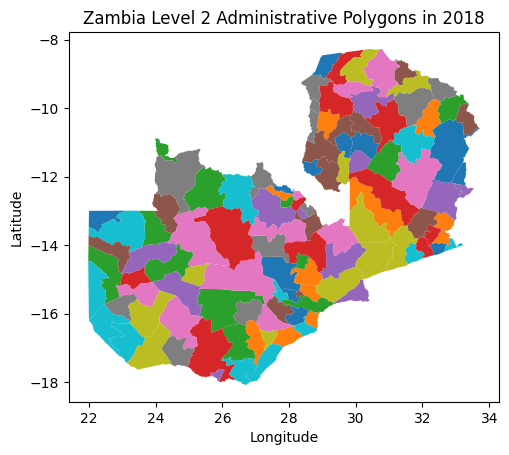

In [5]:
fig, ax = plt.subplots(ncols=1, sharex=True, sharey=True)
shape_new.plot(ax=ax, column=f"ADM{admin_level}_EN")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Zambia Level {admin_level} Administrative Polygons in 2018')
plt.savefig(f'figures/ZMB2018_adm{admin_level}_polygons.pdf')

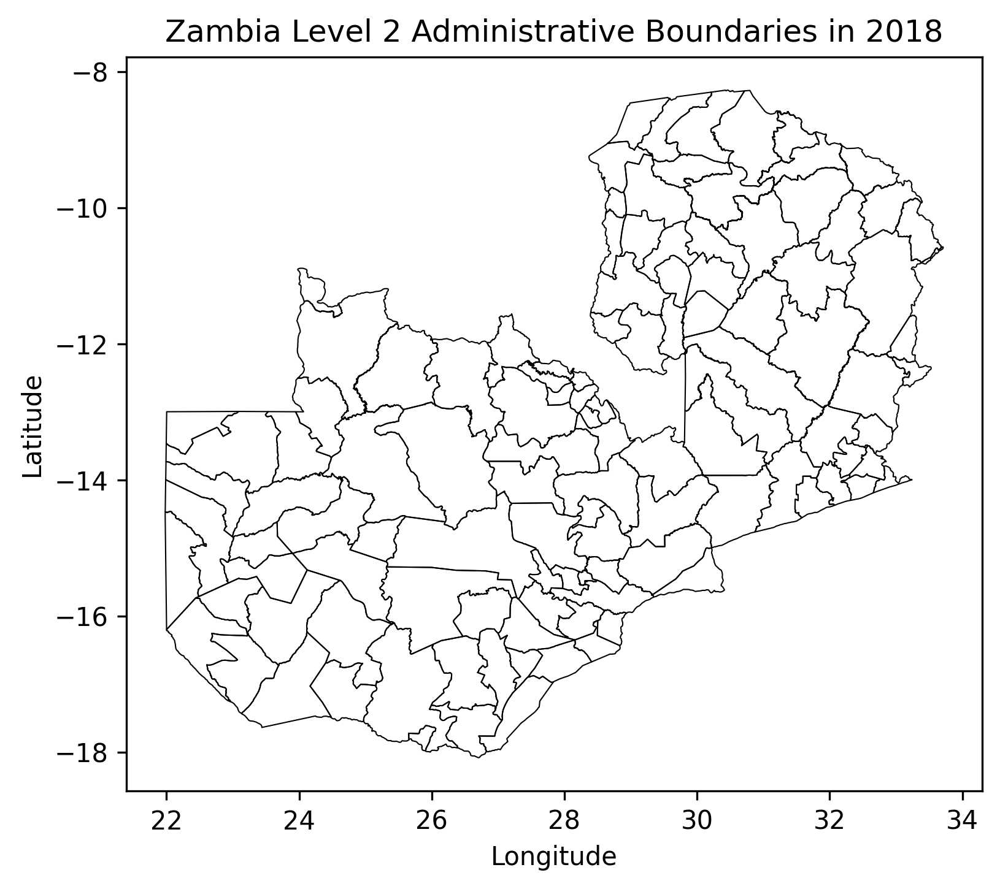

In [6]:
shape_new.boundary.plot(linewidth=0.5,  edgecolor='black', figsize=(6,6))
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Zambia Level {admin_level} Administrative Boundaries in 2018')
plt.savefig(f'figures/ZMB2018_adm{admin_level}_boundaries.pdf')

In [7]:
# capitalise unit names
names_shape_new = shape_new[f"ADM{admin_level}_EN"].values
shape_new[f"ADM{admin_level}_EN"] =  np.array([names_shape_new[i].upper() for i in range(len(names_shape_new))])
shape_new.head(5)

,ADM2_EN,geometry,new
0,CHIBOMBO,"POLYGON ((28.00409 -14.51361, 28.00989 -14.514...",1
1,CHISAMBA,"POLYGON ((28.65022 -14.38920, 28.65131 -14.389...",1
2,CHITAMBO,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1
3,ITEZHI-TEZHI,"POLYGON ((26.99044 -15.46178, 27.20284 -15.468...",1
4,KABWE,"POLYGON ((28.33593 -14.26089, 28.33684 -14.262...",1


In [8]:
names_shape_new = shape_new[f"ADM{admin_level}_EN"].values
names_shape_new

array(['CHIBOMBO', 'CHISAMBA', 'CHITAMBO', 'ITEZHI-TEZHI', 'KABWE',
       'LUANO', 'MKUSHI', 'MUMBWA', 'NGABWE', 'SERENJE', 'CHILILABOMBWE',
       'CHINGOLA', 'KALULUSHI', 'KITWE', 'LUANSHYA', 'LUFWANYAMA',
       'MASAITI', 'MPONGWE', 'MUFULIRA', 'NDOLA', 'CHADIZA', 'CHASEFU',
       'CHIPANGALI', 'CHIPATA', 'KASENENGWA', 'KATETE', 'LUMEZI',
       'LUNDAZI', 'MAMBWE', 'NYIMBA', 'PETAUKE', 'SINDA', 'VUBWI',
       'CHEMBE', 'CHIENGI', 'CHIFUNABULI', 'CHIPILI', 'KAWAMBWA', 'LUNGA',
       'MANSA', 'MILENGI', 'MWANSABOMBWE', 'MWENSE', 'SAMFYA', 'CHILANGA',
       'CHIRUNDU', 'CHONGWE', 'KAFUE', 'LUANGWA', 'LUSAKA', 'RUFUNSA',
       'SHIBUYUNJI', 'CHAMA', 'CHINSALI', 'ISOKA', 'KANCHIBIYA',
       'LAVUSHIMANDA', 'MAFINGA', 'MPIKA', 'NAKONDE', 'CHAVUMA',
       'IKELENGE', 'KABOMPO', 'KALUMBILA', 'KASEMPA', 'MANYINGA',
       'MUFUMBWE', 'MUSHINDANO', 'MWINILUNGA', 'SOLWEZI', 'ZAMBEZI',
       'CHILUBI', 'KAPUTA', 'KASAMA', 'LUNTE DISTRICT', 'LUPOSOSHI',
       'LUWINGU', 'MBALA', 'MPU

# Malaria data

In [9]:
infections_new = pd.read_csv(f"../../data/dhs/ZMB_prev_data_admin{admin_level}.csv")
infections_new = infections_new[['unit', 'usage', 'num_rdt', 'num_rdt_positive', 'prev_estimate']]
infections_new = infections_new.rename({'unit': 'area'}, axis='columns')
infections_new = infections_new.sort_values(by=['area'])
infections_new.head(5)

,area,usage,num_rdt,num_rdt_positive,prev_estimate
0,Chadiza,0.592593,43.522101,2.352546,0.054054
1,Chama,0.656690,219.745559,13.109616,0.059658
2,Chasefu,0.491268,157.033307,2.872475,0.018292
3,Chavuma,0.438596,56.444920,5.039725,0.089286
4,Chembe,0.826087,50.954995,0.000000,0.000000


## Merge infections and shape

In [10]:
if (admin_level==2):
    # Create new rows with zero values
    new_rows = pd.DataFrame({'area': ['CHIRUNDU', 'ITEZHI-TEZHI', 'SHIBUYUNJI'],
                             'usage': [0.0, 0.0, 0.0],
                             'num_rdt': [0.0, 0.0, 0.0],
                             'num_rdt_positive': [0.0, 0.0, 0.0],
                             'prev_estimate': [0.0, 0.0, 0.0]})

    # Append new rows to infections_new
    infections_new = pd.concat([infections_new, new_rows])

In [11]:
names_infections_new = infections_new.area.values
shape_new = shape_new.rename({f"ADM{admin_level}_EN": 'area'}, axis='columns')
shape_new = shape_new.sort_values(by=['area'])
shape_new.head(3)
names_shape_new = shape_new['area'].values
print(names_infections_new)
print(names_shape_new)

['Chadiza' 'Chama' 'Chasefu' 'Chavuma' 'Chembe' 'Chibombo' 'Chiengi'
 'Chifunabuli' 'Chikankanta' 'Chilanga' 'Chililabombwe' 'Chilubi'
 'Chingola' 'Chinsali' 'Chipangali' 'Chipata' 'Chipili' 'Chisamba'
 'Chitambo' 'Choma' 'Chongwe' 'Gwembe' 'Ikelenge' 'Isoka' 'Kabompo'
 'Kabwe' 'Kafue' 'Kalabo' 'Kalomo' 'Kalulushi' 'Kalumbila' 'Kanchibiya'
 'Kaoma' 'Kapiri Mposhi' 'Kaputa' 'Kasama' 'Kasempa' 'Kasenengwa' 'Katete'
 'Kawambwa' 'Kazungula' 'Kitwe' 'Lavushimanda' 'Limulunga' 'Livingstone'
 'Luampa' 'Luangwa' 'Luano' 'Luanshya' 'Lufwanyama' 'Lukulu' 'Lumezi'
 'Lundazi' 'Lunga' 'Lunte District' 'Lupososhi' 'Lusaka' 'Luwingu'
 'Mafinga' 'Mambwe' 'Mansa' 'Manyinga' 'Masaiti' 'Mazabuka' 'Mbala'
 'Milengi' 'Mitete' 'Mkushi' 'Mongu' 'Monze' 'Mpika' 'Mpongwe' 'Mporokoso'
 'Mpulungu' 'Mufulira' 'Mufumbwe' 'Mulobezi' 'Mumbwa' 'Mungwi'
 'Mushindano' 'Mwandi' 'Mwansabombwe' 'Mwense' 'Mwinilunga' 'Nakonde'
 'Nalolo' 'Namwala' 'Nchelenge' 'Ndola' 'Ngabwe' 'Nkeyema' 'Nsama'
 'Nyimba' 'Pemba' 'Petauke' 'R

In [12]:
# Re-labelling for admin level 1
if (admin_level==1):
    names_infections_new[6] = 'North-Western'
# convert to uppercase
names_infections_new = [names_infections_new[i].upper() for i in range(len(names_infections_new))]
print(names_infections_new)
print(names_shape_new)

['CHADIZA', 'CHAMA', 'CHASEFU', 'CHAVUMA', 'CHEMBE', 'CHIBOMBO', 'CHIENGI', 'CHIFUNABULI', 'CHIKANKANTA', 'CHILANGA', 'CHILILABOMBWE', 'CHILUBI', 'CHINGOLA', 'CHINSALI', 'CHIPANGALI', 'CHIPATA', 'CHIPILI', 'CHISAMBA', 'CHITAMBO', 'CHOMA', 'CHONGWE', 'GWEMBE', 'IKELENGE', 'ISOKA', 'KABOMPO', 'KABWE', 'KAFUE', 'KALABO', 'KALOMO', 'KALULUSHI', 'KALUMBILA', 'KANCHIBIYA', 'KAOMA', 'KAPIRI MPOSHI', 'KAPUTA', 'KASAMA', 'KASEMPA', 'KASENENGWA', 'KATETE', 'KAWAMBWA', 'KAZUNGULA', 'KITWE', 'LAVUSHIMANDA', 'LIMULUNGA', 'LIVINGSTONE', 'LUAMPA', 'LUANGWA', 'LUANO', 'LUANSHYA', 'LUFWANYAMA', 'LUKULU', 'LUMEZI', 'LUNDAZI', 'LUNGA', 'LUNTE DISTRICT', 'LUPOSOSHI', 'LUSAKA', 'LUWINGU', 'MAFINGA', 'MAMBWE', 'MANSA', 'MANYINGA', 'MASAITI', 'MAZABUKA', 'MBALA', 'MILENGI', 'MITETE', 'MKUSHI', 'MONGU', 'MONZE', 'MPIKA', 'MPONGWE', 'MPOROKOSO', 'MPULUNGU', 'MUFULIRA', 'MUFUMBWE', 'MULOBEZI', 'MUMBWA', 'MUNGWI', 'MUSHINDANO', 'MWANDI', 'MWANSABOMBWE', 'MWENSE', 'MWINILUNGA', 'NAKONDE', 'NALOLO', 'NAMWALA', 'NC

In [13]:
names_shape_new_lst = list(names_shape_new)
lst = [names_shape_new_lst[i] not in names_infections_new for i in range(len(names_shape_new))]
[names_shape_new_lst[i] for i in range(len(lst)) if lst[i] == True]

[]

In [14]:
names_infections_lst = list(names_infections_new)
lst2 = [names_infections_lst[i] not in names_shape_new for i in range(len(names_infections_new))]
[names_infections_lst[i] for i in range(len(lst2)) if lst2[i] == True]

[]

In [15]:
names_infections_new

['CHADIZA',
 'CHAMA',
 'CHASEFU',
 'CHAVUMA',
 'CHEMBE',
 'CHIBOMBO',
 'CHIENGI',
 'CHIFUNABULI',
 'CHIKANKANTA',
 'CHILANGA',
 'CHILILABOMBWE',
 'CHILUBI',
 'CHINGOLA',
 'CHINSALI',
 'CHIPANGALI',
 'CHIPATA',
 'CHIPILI',
 'CHISAMBA',
 'CHITAMBO',
 'CHOMA',
 'CHONGWE',
 'GWEMBE',
 'IKELENGE',
 'ISOKA',
 'KABOMPO',
 'KABWE',
 'KAFUE',
 'KALABO',
 'KALOMO',
 'KALULUSHI',
 'KALUMBILA',
 'KANCHIBIYA',
 'KAOMA',
 'KAPIRI MPOSHI',
 'KAPUTA',
 'KASAMA',
 'KASEMPA',
 'KASENENGWA',
 'KATETE',
 'KAWAMBWA',
 'KAZUNGULA',
 'KITWE',
 'LAVUSHIMANDA',
 'LIMULUNGA',
 'LIVINGSTONE',
 'LUAMPA',
 'LUANGWA',
 'LUANO',
 'LUANSHYA',
 'LUFWANYAMA',
 'LUKULU',
 'LUMEZI',
 'LUNDAZI',
 'LUNGA',
 'LUNTE DISTRICT',
 'LUPOSOSHI',
 'LUSAKA',
 'LUWINGU',
 'MAFINGA',
 'MAMBWE',
 'MANSA',
 'MANYINGA',
 'MASAITI',
 'MAZABUKA',
 'MBALA',
 'MILENGI',
 'MITETE',
 'MKUSHI',
 'MONGU',
 'MONZE',
 'MPIKA',
 'MPONGWE',
 'MPOROKOSO',
 'MPULUNGU',
 'MUFULIRA',
 'MUFUMBWE',
 'MULOBEZI',
 'MUMBWA',
 'MUNGWI',
 'MUSHINDANO',
 'MWAN

In [16]:
infections_new.area = names_infections_new
infections_new

,area,usage,num_rdt,num_rdt_positive,prev_estimate
0,CHADIZA,0.592593,43.522101,2.352546,0.054054
1,CHAMA,0.656690,219.745559,13.109616,0.059658
2,CHASEFU,0.491268,157.033307,2.872475,0.018292
3,CHAVUMA,0.438596,56.444920,5.039725,0.089286
4,CHEMBE,0.826087,50.954995,0.000000,0.000000
...,...,...,...,...,...
110,ZAMBEZI,0.729241,121.081102,1.686360,0.013928
111,ZIMBA,0.542139,89.358756,9.592446,0.107348
0,CHIRUNDU,0.000000,0.000000,0.000000,0.000000
1,ITEZHI-TEZHI,0.000000,0.000000,0.000000,0.000000


In [17]:
shape_new = shape_new.merge(infections_new, how='left', left_on='area', right_on='area')
shape_new.head(3)

,area,geometry,new,usage,num_rdt,num_rdt_positive,prev_estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",1,0.592593,43.522101,2.352546,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",1,0.656690,219.745559,13.109616,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",1,0.491268,157.033307,2.872475,0.018292


In [18]:
np.sum(np.isnan(shape_new.num_rdt))

0

In [19]:
s_new = shape_new.rename({'num_rdt': 'n_obs', 'num_rdt_positive': 'y', 'prev_estimate': 'estimate'}, axis='columns')
s_new['y'] = round(s_new['y']).astype(int)
s_new['n_obs'] = round(s_new['n_obs']).astype(int)
s_new.head(3)

,area,geometry,new,usage,n_obs,y,estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",1,0.592593,44,2,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",1,0.656690,220,13,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",1,0.491268,157,3,0.018292


In [20]:
s_new_plot = shape_new.rename({'num_rdt': 'Total observations', 'num_rdt_positive': 'Positive test count', 'prev_estimate': 'Prevalence estimate'}, axis='columns')

In [21]:
s_new_plot

,area,geometry,new,usage,Total observations,Positive test count,Prevalence estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",1,0.592593,43.522101,2.352546,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",1,0.656690,219.745559,13.109616,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",1,0.491268,157.033307,2.872475,0.018292
3,CHAVUMA,"POLYGON ((21.99573 -13.46393, 21.99610 -13.439...",1,0.438596,56.444920,5.039725,0.089286
4,CHEMBE,"POLYGON ((28.89259 -11.50817, 28.87754 -11.520...",1,0.826087,50.954995,0.000000,0.000000
...,...,...,...,...,...,...,...
110,SIOMA,"POLYGON ((23.22303 -16.24968, 23.22304 -16.249...",1,0.740689,47.863205,5.892910,0.123120
111,SOLWEZI,"POLYGON ((26.54644 -11.95768, 26.55784 -11.971...",1,0.428974,407.405644,17.259948,0.042366
112,VUBWI,"POLYGON ((32.93181 -13.86676, 32.94124 -13.874...",1,0.620205,120.844356,3.945904,0.032653
113,ZAMBEZI,"POLYGON ((23.51068 -13.06689, 23.52472 -13.068...",1,0.729241,121.081102,1.686360,0.013928


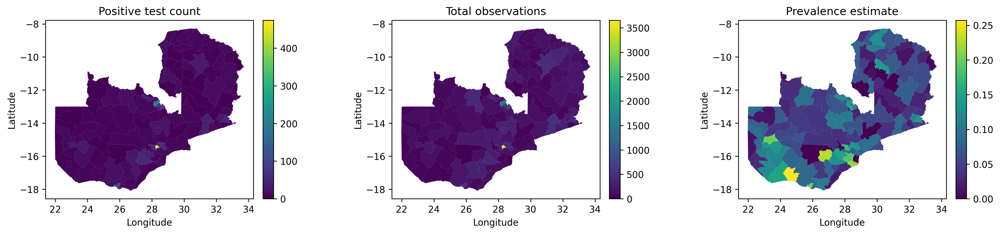

In [22]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd

# Create subplots
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plot the data with a consistent colorbar size
for i, column in enumerate(["Positive test count", "Total observations", "Prevalence estimate"]):
    plot = s_new_plot.plot(column=column, ax=ax[i], legend=False)
    ax[i].set_title(column)
    ax[i].set_xlabel('Longitude')
    ax[i].set_ylabel('Latitude')
    
    # Create an axis on the right side of the plot for the colorbar
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", size="5%", pad=0.1)
    
    # Create colorbar using the first collection's norm and cmap
    sm = plt.cm.ScalarMappable(cmap=plot.collections[0].cmap, norm=plot.collections[0].norm)
    sm._A = []  # Dummy array for the scalar mappable
    fig.colorbar(sm, cax=cax)

# Adjust space between plots
plt.subplots_adjust(wspace=0.5)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

# Save the figure as a PDF
plt.savefig(f'figures/ZMB2018_{admin_level}_observations.pdf')

In [23]:
if (admin_level==2):
    # Check y and n_obs for capital, Lusaka
    lusaka_data = s_new[s_new['area'] == 'LUSAKA']
    print(lusaka_data[['y', 'n_obs']])

      y  n_obs
58  474   3653


In [24]:
del shape_new
del infections_new

## Computational grid

In [25]:
x_min, x_max, y_min, y_max = 21.5, 34, -19, -8
dy = y_max - y_min
dx = x_max - x_min
factor = dy / dx
n_x = 40 
n_y = math.ceil(n_x * factor)
print(n_x)
print(n_y)
print(n_x * n_y)

x_grid = np.linspace(x_min, x_max, n_x, endpoint=True)
y_grid = np.linspace(y_min, y_max, n_y, endpoint=True)

# full coordinate arrays
x_coords, y_coords = np.meshgrid(x_grid, y_grid)
x_coords = x_coords.reshape(-1)
y_coords = y_coords.reshape(-1)

df = pd.DataFrame({'Latitude': y_coords, 'Longitude': x_coords})

grid_pts = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude))

x = jnp.array([x_coords, y_coords]).transpose((1, 0))
print(x.shape)

40
36
1440
(1440, 2)


2024-08-11 13:00:06.228774: W external/xla/xla/service/gpu/nvptx_compiler.cc:836] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version (12.5.40). Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [26]:
xtest = np.tile(x, (12, 1, 1))
xtest.shape

(12, 1440, 2)

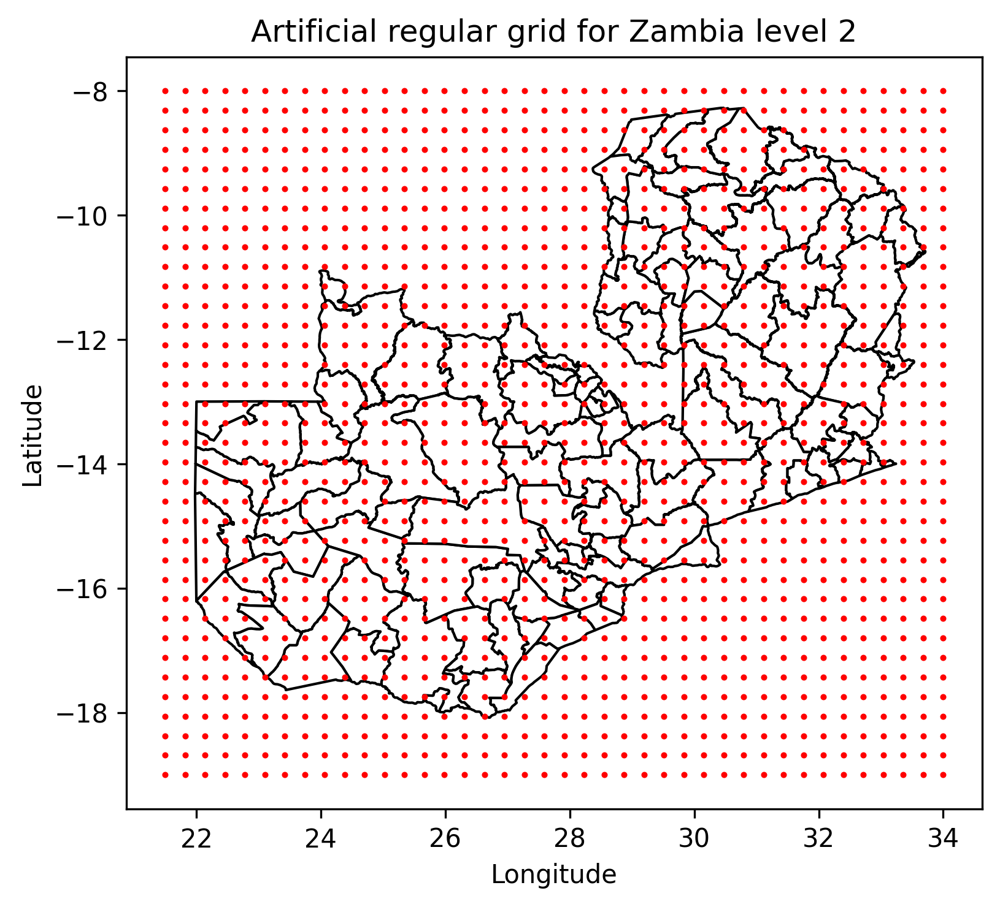

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(6,6))
divider = make_axes_locatable(ax)
s_new.plot(ax=ax, color='white', edgecolor='black')
grid_pts.plot(ax=ax, marker='o', color='red', markersize=2)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Artificial regular grid for Zambia level {admin_level}')
plt.savefig(f'figures/ZMB2018_adm{admin_level}_regular_grid.pdf')

In [28]:
def pol_pts(shape, grid_pts, min_pts=10):
    grid_pts.set_crs(epsg=4326, inplace=True);
    grid_pts.crs == shape.crs

    n_pol = len(shape.geometry)
    n_pts = len(grid_pts.geometry)

    pl_pt = np.zeros((n_pol, n_pts), dtype=int)

    pt_which_pol = np.zeros(n_pts, dtype=int)

    for i_pol in range(n_pol):
        pol = shape.geometry[i_pol]
        for j_pts in range(n_pts):
            pt = grid_pts.geometry[j_pts]
            if pol.contains(pt):
                pl_pt[i_pol, j_pts] = 1
                pt_which_pol[j_pts] = i_pol + 1 # note the enumeration!


    # ensure a minimum number of points

    pol_sums = np.sum(pl_pt, axis=1)

    fix_pols = np.where(pol_sums<min_pts)[0]

    if fix_pols.size > 0:

      for i_pol in fix_pols:

        # print(f'i_pol:{i_pol}')

        polygon = shape.geometry[i_pol]
        no_points = pol_sums[i_pol]

        extra_len = min_pts - no_points
        minx, miny, maxx, maxy = polygon.bounds
        extra_y_coords = []
        extra_x_coords = []

        main_rng_key = random.PRNGKey(44)

        # print(extra_len)

        while extra_len > 0:
            main_rng_key, rng_key_pts = random.split(main_rng_key)
            random_point_coords = [
                random.uniform(rng_key_pts, (1,), minval=minx, maxval=maxx)[0],
                random.uniform(rng_key_pts, (1,), minval=miny, maxval=maxy)[0]
            ]
            random_point = Point(float(random_point_coords[0]), float(random_point_coords[1]))

            if polygon.contains(random_point):
              # print('Contains random point')
              extra_y_coords.append(random_point.y)
              extra_x_coords.append(random_point.x)
              extra_len -= 1

        # add extra points to grid

        # Create DataFrame for new points
        extra_df = pd.DataFrame({'Latitude': extra_y_coords, 'Longitude': extra_x_coords})
        extra_grid_pts = gpd.GeoDataFrame(extra_df, geometry=gpd.points_from_xy(extra_df.Longitude, extra_df.Latitude))

        # Set CRS for the new GeoDataFrame
        extra_grid_pts.set_crs(epsg=4326, inplace=True)

        # Concatenate the original and new GeoDataFrames
        grid_pts = pd.concat([grid_pts, extra_grid_pts]).reset_index(drop=True)


      # Amend pl_pt and pt_which_pol (outside polygon loop)
      pl_pt, pt_which_pol, _ = pol_pts(shape, grid_pts, min_pts)

    return([pl_pt, pt_which_pol, grid_pts])

In [29]:
pol_pt_new, pt_which_pol_new, grid_pts_new = pol_pts(s_new, grid_pts, min_pts=10)
pol_sums_new = np.sum(pol_pt_new, axis=1) # how many points in each polygon
# print(all(item > 0 for item in pol_sums_new)) # in each polygon there is at least one point
print(all(item >= 10 for item in pol_sums_new)) # in each polygon there is at least 10 points
grid_pts_new['pt_which_pol_new'] = pt_which_pol_new
grid_pts_new

True


,Latitude,Longitude,geometry,pt_which_pol_new
0,-19.000000,21.500000,POINT (21.50000 -19.00000),0
1,-19.000000,21.820513,POINT (21.82051 -19.00000),0
2,-19.000000,22.141026,POINT (22.14103 -19.00000),0
3,-19.000000,22.461538,POINT (22.46154 -19.00000),0
4,-19.000000,22.782051,POINT (22.78205 -19.00000),0
...,...,...,...,...
2013,-17.455769,26.790142,POINT (26.79014 -17.45577),115
2014,-17.507141,26.722168,POINT (26.72217 -17.50714),115
2015,-17.777426,26.364519,POINT (26.36452 -17.77743),115
2016,-17.394756,26.870876,POINT (26.87088 -17.39476),115


In [30]:
pol_pt_new.shape

(115, 2018)

In [31]:
pol_sums_new

array([10, 16, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 13, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 18, 10, 10, 10, 13, 10, 13, 10, 10, 10, 10, 11, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 13, 10, 10, 10, 10, 15, 10, 18, 10, 10, 10, 10, 10,
       17, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       11, 10, 10, 10, 10, 10, 10, 10, 10, 11, 10, 12, 10])

In [32]:
new_y_coords = grid_pts_new['Latitude']
new_x_coords = grid_pts_new['Longitude']
new_x = jnp.array([new_x_coords, new_y_coords]).transpose((1, 0))
print(new_x.shape)

(2018, 2)


In [33]:
grid_pts = grid_pts_new
grid_pts.shape

(2018, 4)

In [34]:
grid_pts['in_out_new'] = grid_pts['pt_which_pol_new'].apply(lambda x: 'out' if x==0 else 'in')
grid_pts['marker_size_new'] = grid_pts['pt_which_pol_new'].apply(lambda x: 1 if x==0 else 12)
n_pol_new = len(s_new.geometry)

In [35]:
cmap = plt.cm.prism  # define the colormap
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
cmaplist[0] = (.5, .5, .5, 1.0)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list('Custom cmap', cmaplist, cmap.N)

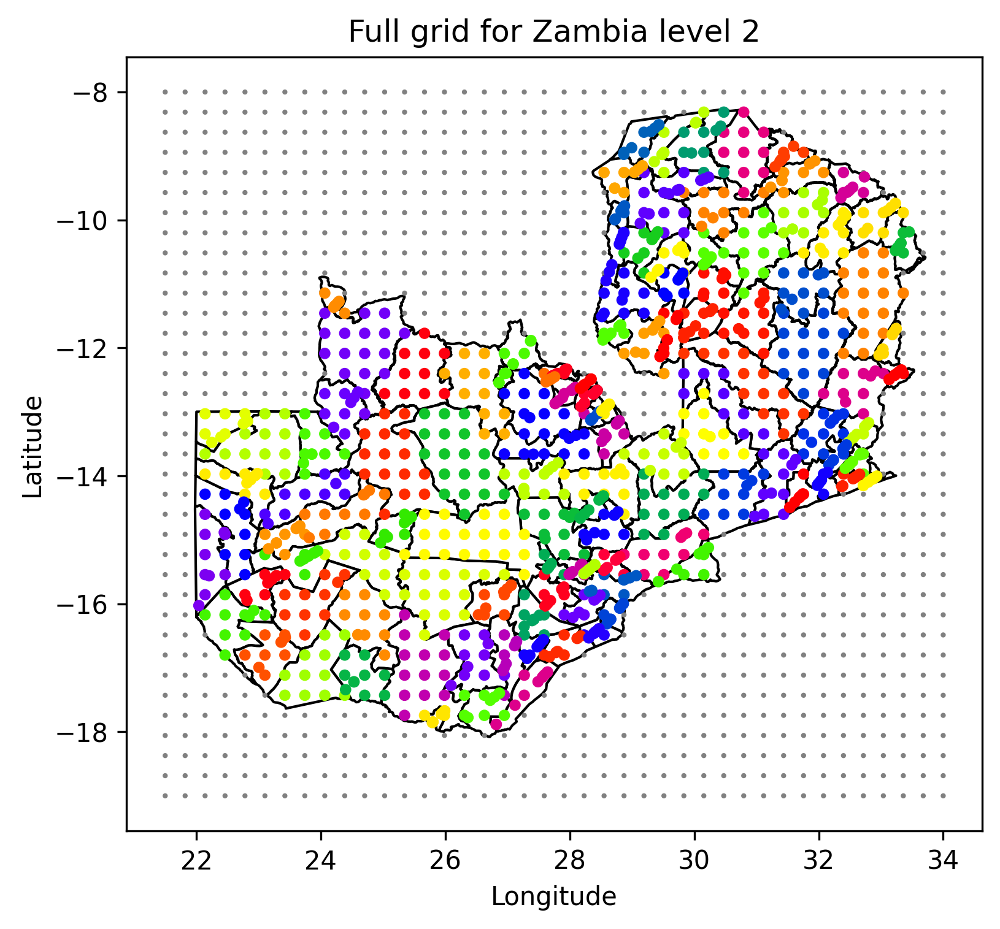

In [36]:
fig, ax2 = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(6,6))
divider = make_axes_locatable(ax)

# define the bins and normalize
bounds_new = np.linspace(min(pt_which_pol_new), max(pt_which_pol_new), n_pol_new)
norm_new = matplotlib.colors.BoundaryNorm(bounds_new, cmap.N)
s_new.plot(ax=ax2, color='white', edgecolor='black')
grid_pts.plot(ax=ax2, marker='o', column='pt_which_pol_new', markersize='marker_size_new', cmap=cmap)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Full grid for Zambia level {admin_level}')
plt.savefig(f'figures/ZMB2018_adm{admin_level}_full_segmentation.pdf')

In [37]:
s_new.head(3)

,area,geometry,new,usage,n_obs,y,estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",1,0.592593,44,2,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",1,0.656690,220,13,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",1,0.491268,157,3,0.018292


In [38]:
type(s_new)

geopandas.geodataframe.GeoDataFrame

In [39]:
s = s_new.rename({'Total observations':'n_obs', 'Positive tests count':'y', 'Prevalence estimate':'estimate'}, axis='columns')
# s = pd.concat([s_old, s_new])
s.head()
#print(s.shape)

,area,geometry,new,usage,n_obs,y,estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",1,0.592593,44,2,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",1,0.656690,220,13,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",1,0.491268,157,3,0.018292
3,CHAVUMA,"POLYGON ((21.99573 -13.46393, 21.99610 -13.439...",1,0.438596,56,5,0.089286
4,CHEMBE,"POLYGON ((28.89259 -11.50817, 28.87754 -11.520...",1,0.826087,51,0,0.000000


# Traditional prevalence model

In [40]:
# draw GP samples on the grid

def dist_euclid(x, z):
    x = jnp.array(x)
    z = jnp.array(z)
    if len(x.shape)==1:
        x = x.reshape(x.shape[0], 1)
    if len(z.shape)==1:
        z = x.reshape(x.shape[0], 1)
    n_x, m = x.shape
    n_z, m_z = z.shape
    assert m == m_z
    delta = jnp.zeros((n_x,n_z))
    for d in jnp.arange(m):
        x_d = x[:,d]
        z_d = z[:,d]
        delta += (x_d[:,jnp.newaxis] - z_d)**2
    return jnp.sqrt(delta)


def exp_sq_kernel(x, z, var, length, noise, jitter=1.0e-4):
    dist = dist_euclid(x, z)
    deltaXsq = jnp.power(dist/ length, 2.0)
    k = var * jnp.exp(-0.5 * deltaXsq)
    k += (noise + jitter) * jnp.eye(x.shape[0])
    return k

In [41]:
def M_g(M, g):
    '''
    - $M$ is a matrix with binary entries $m_{ij},$ showing whether point $j$ is in polygon $i$
    - $g$ is a vector of GP draws over grid
    - $maltmul(M, g)$ gives a vector of sums over each polygon
    '''
    M = jnp.array(M)
    g = jnp.array(g).T
    return(jnp.matmul(M, g))

## CVAE architecture

In [42]:
# ! pip install --upgrade flax

In [43]:
from collections.abc import Callable
from typing import Iterable

import flax.linen as nn
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpyro
import numpyro.distributions as dist
import optax
from flax.training.train_state import TrainState
from jax import Array, value_and_grad, jit, random
from jax.scipy.stats import norm
from numpyro.infer import MCMC, NUTS
from tqdm.notebook import tqdm

In [44]:
args = {"seed": 0,

        # architecture
        "conditional": True,
        "hidden_dim": 512,
        "z_dim": 256,

        # data generation
        "new_data": True,  # set to True to generate new data. Otherwise read from file
        "save_data": False, # set to True to save generated training and test datasets
        "batch_size": 100,
        "samples": 5000,

        # VAE setup
        "vae_sd": 1,
        "n_epochs": 250,        # for better results, set to 15000
        "learning_rate": 1e-3,
        "train_vae": True,      # set to True to train VAE
        "save_vae": False,
        "load_vae": False,      # set to True to load trained CVAE
        "decoder_params": None,
        "hyperprior_ls_name": "InverseGamma(3, 3)",
        "hyperprior_var_name": "HalfNormal(0.05)",
        "hyperprior_ls": dist.InverseGamma(3, 3),
        "hyperprior_var": dist.HalfNormal(0.05),

        # MCMC setup
        "num_warmup": 200,
        "num_mcmc_samples": 1000,
        "num_chains": 4,
        "thinning": 1,
        "true_ls": 0.2,

        'n_obs': jnp.array(s.n_obs),
        "x": new_x,
        "gp_kernel": exp_sq_kernel,
        "jitter": 1e-4,
        "M_new": pol_pt_new,
        
        # posterior analysis
        "num_samples_posterior": 1000,

        # VAE training
        "rng_key": random.PRNGKey(5),

        "include_aggVAE": True

       }

In [45]:
model_specs =('_admin' + str(admin_level)+
              '_mcmcsamp' + str(args['num_mcmc_samples'])+
             '_h' + str(args["hidden_dim"])+
             '_z' + str(args["z_dim"])+
             '_epochs' + str(args["n_epochs"])+
             '_ls' + args['hyperprior_ls_name']+
             '_var' + args['hyperprior_var_name'])
print('Model specifications:', model_specs)

Model specifications: _admin2_mcmcsamp1000_h512_z256_epochs250_lsInverseGamma(3, 3)_varHalfNormal(0.05)


In [46]:
# Create the new directory
os.makedirs('figures/ZMB2018_comparison'+model_specs, exist_ok=True)
os.makedirs('figures/ZMB2018_aggCVAE'+model_specs, exist_ok=True)
os.makedirs('figures/ZMB2018_aggVAE'+model_specs, exist_ok=True)
os.makedirs(f'figures/ZMB2018_aggGP_admin{admin_level}_mcmcsamp3000_lsInverseGamma(3, 3)_varHalfNormal(0.05)_numchains1', exist_ok=True)


In [47]:
from collections.abc import Callable
from flax import linen as nn


class MLP(nn.Module):
    dims: list[int]
    act_fn: Callable = nn.relu
    p_dropout: float = 0.0

    @nn.compact
    def __call__(self, x, training: bool = False):
        for dim in self.dims[:-1]:
            x = nn.Dense(dim)(x)
            x = self.act_fn(x)
            x = nn.Dropout(self.p_dropout, deterministic=not training)(x)
        return nn.Dense(self.dims[-1])(x)

In [48]:
#!/usr/bin/env python3
import jax.numpy as jnp
from flax import linen as nn
from jax import Array, random


class PriorCVAE(nn.Module):
    r"""[PriorCVAE](https://arxiv.org/pdf/2304.04307) approximates a Gaussian Process.

    Once trained, the module's `decoder` can be used as a generative
    model to simulate a GP from the samples it was trained on.

    Args:
        encoder: A module used to encode GP realizations and
            their hyperparamters.
        decoder: A module used to decode random vectors and
            GP hyperparameters into GP samples.
        z_dim: The size of the hidden dimension.

    Returns:
        An instance of the PriorCVAE network.
        $\hat{\mathbf{f}}$, a recreation of the original $\mathbf{f}$,
        along with $\mu$ and $\log(\sigma^2)$, which are often used
        to calculate losses involving KL divergence.
    """

    encoder: nn.Module
    decoder: nn.Module
    z_dim: int

    @nn.compact
    def __call__(self, rng: Array, var: float, ls: float, f: Array):
        r"""Run module forward.

        Args:
            rng: A pseudo-random number generator.
            var: The variance for the GP.
            ls: The lengthscale for the GP.
            f: The function values, an array of shape `(B, K, 1)`.

        Returns:
            $\hat{\mathbf{f}}$, a recreation of the original$\mathbf{f}$,
            along with $\mu$ and $\log(\sigma^2)$, which are often used
            to calculate losses involving KL divergence.
        """
        batch_size = f.shape[0]
        var = jnp.full((batch_size, 1), var)
        ls = jnp.full((batch_size, 1), ls)
        f_flat = f.reshape(batch_size, -1)
        latents = self.encoder(jnp.hstack([f_flat, var, ls]))
        mu = nn.Dense(self.z_dim)(latents)
        log_var = nn.Dense(self.z_dim)(latents)
        std = jnp.exp(log_var / 2)
        eps = random.normal(rng, log_var.shape)
        z = mu + std * eps
        f_hat = self.decoder(jnp.hstack([z, var, ls]))
        return f_hat.reshape(f.shape), mu, log_var
    
    def decode(self, z: Array, var: float, ls: float):
        B = z.shape[0]
        var = jnp.full((B, 1), var)
        ls = jnp.full((B, 1), ls)
        return self.decoder(jnp.hstack([z, var, ls]))

In [49]:
def build_prior_cvae(num_s: int = 64, z_dim: int = 64, hidden_dim: int = 256):
    encoder = MLP([hidden_dim, z_dim])
    decoder = MLP([hidden_dim, num_s])
    return PriorCVAE(encoder, decoder, z_dim)

@jit
def prior_cvae_train_step(rng, state, batch):
    def elbo_loss(params):
        _s, f, ls, var  = batch
        f_hat, z_mu, z_log_var = state.apply_fn({"params": params}, rng, var, ls, f)
        kl_div = (0.5 * (jnp.exp(z_log_var) + jnp.square(z_mu) - 1 - z_log_var)).mean()
        logp = norm.logpdf(f, f_hat, 1.0).mean()
        return -logp + kl_div

    loss, grads = value_and_grad(elbo_loss)(state.params)
    return state.apply_gradients(grads=grads), loss

In [50]:
model_args = args
n_samples = args['samples']
num_epochs = args['n_epochs']
x = args['x']

# num_s is 10 for admin 1 because there are 10 polygons, i.e. the K in (B, K, 1)
if admin_level == 1:
    num_s = 10
if admin_level == 2:
    num_s  = 115

batch_size = args['batch_size']

# Train VAE

In [51]:
# have to add number of epochs in training so that the name is relevant
model_save_name = f'aggCVAE_decoder' + model_specs
PATH = F"decoders/{model_save_name}"
PATH_loss = F"losses/{model_save_name}"

In [52]:
# Load
with open(PATH, 'rb') as file:
   decoder_params = pickle.load(file)
   print(len(decoder_params))

args["decoder_params"] = decoder_params

2


In [53]:
# with open(PATH_loss, 'rb') as file:
#    losses_save = pickle.load(file)

# train_losses_save = losses_save['train_losses']
# val_losses_save = losses_save['val_losses']

# print(losses_save)

In [54]:
# plt.plot(np.arange(20, len(train_losses_save), 1), train_losses_save[20:], label="train loss")
# plt.plot(np.arange(20, len(val_losses_save), 1), val_losses_save[20:], label="test loss")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.legend()
# plt.title("Train and test losses, AggCVAE")

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['savefig.dpi'] = 300
# plt.savefig('figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+model_specs+'_loss_short.pdf')

In [55]:
def gp_aggr(args):

    x = args["x"]
    gp_kernel=args["gp_kernel"]
    jitter = args["jitter"]
    M_new = args["M_new"]

    # random effect - aggregated GP
    length = numpyro.sample("kernel_length", args['hyperprior_ls'])
    variance = numpyro.sample("kernel_var", args['hyperprior_var'])
    k = gp_kernel(x, x, variance, length, jitter)
    f = numpyro.sample("f", dist.MultivariateNormal(loc=jnp.zeros(x.shape[0]), covariance_matrix=k))

    # aggregate f into gp_aggr according to indexing of (point in polygon)
    gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f))
    gp_aggr = numpyro.deterministic('gp_aggr', gp_aggr_new)
    ls = numpyro.deterministic('ls', length)
    var = numpyro.deterministic('var', variance)

In [56]:
rng_key, rng_key_ = random.split(random.PRNGKey(4))
agg_gp_predictive = Predictive(gp_aggr, num_samples=args['num_samples_posterior'])
agg_gp_preds = agg_gp_predictive(rng_key_, args)
agg_gp_draws = agg_gp_preds['gp_aggr_new']

In [57]:
def vae_sample(args):

    decoder_params = args["decoder_params"]
    z_dim_cond, hidden_dim = decoder_params['Dense_0']['kernel'].shape
    z_dim = z_dim_cond - 2   # z_dim_cond includes both lengthscale and variance

    # will have to change to match closer to reality
    var = numpyro.sample("var", args['hyperprior_var'])
    ls = numpyro.sample("ls", args['hyperprior_ls'])
    z = numpyro.sample("z", dist.Normal(jnp.zeros(z_dim), jnp.ones(z_dim)))
    z = z.reshape(1, z.shape[0])
    
    prior_cvae_sample = build_prior_cvae(num_s, z_dim=args['z_dim'], hidden_dim = args['hidden_dim'])
    decoder_nn = prior_cvae_sample.apply({"params": {'decoder': decoder_params}}, z, var, ls, method='decode')
    vae_aggr = numpyro.deterministic("vae_aggr", decoder_nn)

In [58]:
rng_key, rng_key_predict = random.split(random.PRNGKey(4))
vae_predictive = Predictive(vae_sample, num_samples=args['num_samples_posterior'])
vae_draws = vae_predictive(rng_key_predict, args)['vae_aggr']

In [59]:
# # Create a figure with a gridspec
# fig = plt.figure(figsize=(20, 10))
# gs = gridspec.GridSpec(2, 6, width_ratios=[1, 1, 1, 1, 1, 0.1], height_ratios=[1, 1], wspace=0.3, hspace=0.05)  # Adjust wspace and hspace for more space between plots

# axs = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(5)]

# # Plot aggGP priors
# for i in range(5):
#     nm = 'gp_aggr_' + str(i)
#     s_new_plot[nm] = agg_gp_draws[i, :]
#     s_new_plot.plot(column=nm, ax=axs[i], legend=False)
#     axs[i].set_xlabel('Longitude')
#     axs[i].set_ylabel('Latitude')
#     axs[i].set_title(f'gp_aggr-prior {i}')

# # Plot VAE priors
# for i in range(5):
#     nm = 'vae_draw_' + str(i)
#     s_new_plot[nm] = vae_draws[i][0]
#     s_new_plot.plot(column=nm, ax=axs[5 + i], legend=False)
#     axs[5 + i].set_xlabel('Longitude')
#     axs[5 + i].set_ylabel('Latitude')
#     axs[5 + i].set_title(f'VAE-prior {i}')

# # Add an overall title
# fig.suptitle('aggGP and VAE priors after training', fontsize=16)

# # Create a shared colorbar
# cbar_ax = fig.add_subplot(gs[:, 5])
# sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=s_new_plot[nm].min(), vmax=s_new_plot[nm].max()))
# cbar = fig.colorbar(sm, cax=cbar_ax)
# cbar_ax.set_ylabel('Value')


# # Save the figure
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['savefig.dpi'] = 300
# plt.savefig('figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+model_specs+'_aggGP_VAE_priors_after_training.pdf')
# plt.show()

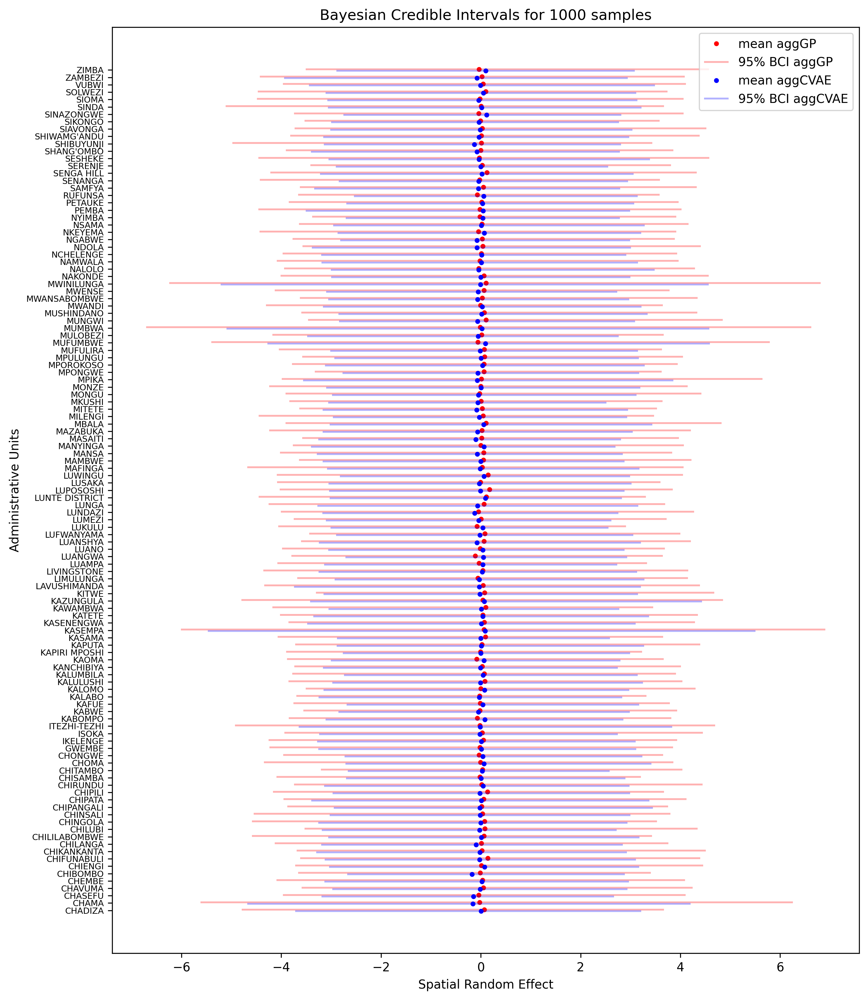

In [60]:
# Mean and HPDI calculations
mean_vae_draws = jnp.mean(vae_draws, axis=0)
hpdi_vae_draws = hpdi(vae_draws, 0.95)
mean_gp_aggr = jnp.mean(agg_gp_draws, axis=0)
hpdi_gp_aggr = hpdi(agg_gp_draws, 0.95)

x = np.arange(0, s.shape[0], 1)

# Sort values for plotting by x-axis
idx = jnp.argsort(x)
x_axis = s['area']

mean_cvae = mean_vae_draws[1][idx]
mean_gp = mean_gp_aggr[idx]

hpdi_cvae = hpdi_vae_draws[:, :, idx]
hpdi_gp = hpdi_gp_aggr[:, idx]

# Calculate reasonable figure height based on the number of administrative units
fig_height = max(len(x_axis) * 0.1, 8)  # Adjust 0.1 as needed to fit the labels comfortably

# Plot with flipped axes
plt.figure(figsize=(10, fig_height))  # Increase the height of the figure

# Introduce an offset for hlines to avoid overlapping by adjusting the index
offset = 0.1  # Adjust the offset as necessary
indices = np.arange(len(x_axis))

plt.plot(mean_gp, indices + offset, ".", label="mean aggGP", color="red")
plt.hlines(indices + offset, xmin=hpdi_gp[0], xmax=hpdi_gp[1], colors="red", alpha=0.3, label="95% BCI aggGP")

plt.plot(mean_cvae, indices - offset, ".", label="mean aggCVAE", color="blue")
plt.hlines(indices - offset, xmin=hpdi_cvae[0][0], xmax=hpdi_cvae[1][0], colors="blue", alpha=0.3, label="95% BCI aggCVAE")



# Map the y-ticks back to the original x_axis values (administrative units)
plt.yticks(indices, x_axis, fontsize=7)  # Customize fontsize and spacing

plt.legend()
plt.xlabel('Spatial Random Effect')
plt.ylabel('Administrative Units')
plt.title(f'Bayesian Credible Intervals for {args["num_samples_posterior"]} samples')

# Save plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.tight_layout()
plt.savefig('figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+model_specs+'_BCI_intervals_priors_before_training.pdf')
plt.show()



In [61]:
if args["include_aggVAE"]:
    def vae_encoder(hidden_dim, z_dim):
        return stax.serial(
            stax.Dense(hidden_dim, W_init=stax.randn()),
            stax.Elu,
            stax.FanOut(2),
            stax.parallel(
                stax.Dense(z_dim, W_init=stax.randn()), # mean
                stax.serial(stax.Dense(z_dim, W_init=stax.randn()), stax.Exp), # std -- i.e. diagonal covariance
            ),
        )

    def vae_decoder( hidden_dim, out_dim):
        return stax.serial(
            stax.Dense(hidden_dim, W_init=stax.randn()),
            stax.Elu,
            stax.Dense(out_dim, W_init=stax.randn())
        )

    def vae_model(batch, hidden_dim, z_dim):
        batch = jnp.reshape(batch, (batch.shape[0], -1))
        batch_dim, out_dim = jnp.shape(batch)
        decode = numpyro.module("decoder", vae_decoder( hidden_dim, out_dim), (batch_dim, z_dim))
        z = numpyro.sample("z", dist.Normal(jnp.zeros((z_dim,)), jnp.ones((z_dim,))))
        gen_loc = decode(z)
        numpyro.sample("obs", dist.Normal(gen_loc, args["vae_var"]), obs=batch)

    def vae_guide(batch, hidden_dim,  z_dim):
        batch = jnp.reshape(batch, (batch.shape[0], -1))
        batch_dim, out_dim = jnp.shape(batch)
        encode = numpyro.module("encoder", vae_encoder(hidden_dim, z_dim), (batch_dim, out_dim))
        z_loc, z_std = encode(batch)
        z_loc = jnp.mean(z_loc, axis=0)  # Aggregate batch dimension
        z_std = jnp.mean(z_std, axis=0)  # Aggregate batch dimension
        z = numpyro.sample("z", dist.Normal(z_loc, z_std))
        return z

In [62]:
if args["include_aggVAE"]:
    if admin_level == 1:
        N = 10
    if admin_level == 2:
        N = 115    
    # have to add number of epochs in training so that the name is relevant
    model_save_name = f'aggVAE_decoder' + model_specs
    PATH = F"decoders/{model_save_name}"
    PATH_loss = F"losses/{model_save_name}"

    with open(PATH, 'rb') as file:
        decoder_params_aggvae = pickle.load(file)

    args["decoder_params_aggvae"] = decoder_params_aggvae

    def aggvae_sample(args):
        decoder_params = args["decoder_params_aggvae"]
        z_dim, hidden_dim = decoder_params[0][0].shape

        z = numpyro.sample("z", dist.Normal(jnp.zeros(z_dim), jnp.ones(z_dim)))
        decoder_nn = vae_decoder( hidden_dim, N)
        vae_aggr = numpyro.deterministic("vae_aggr", decoder_nn[1](decoder_params, z))
    
    rng_key, rng_key_predict = random.split(random.PRNGKey(4))
    aggvae_predictive = Predictive(aggvae_sample, num_samples=args['num_samples_posterior'])
    aggvae_draws = aggvae_predictive(rng_key_predict, args)['vae_aggr']

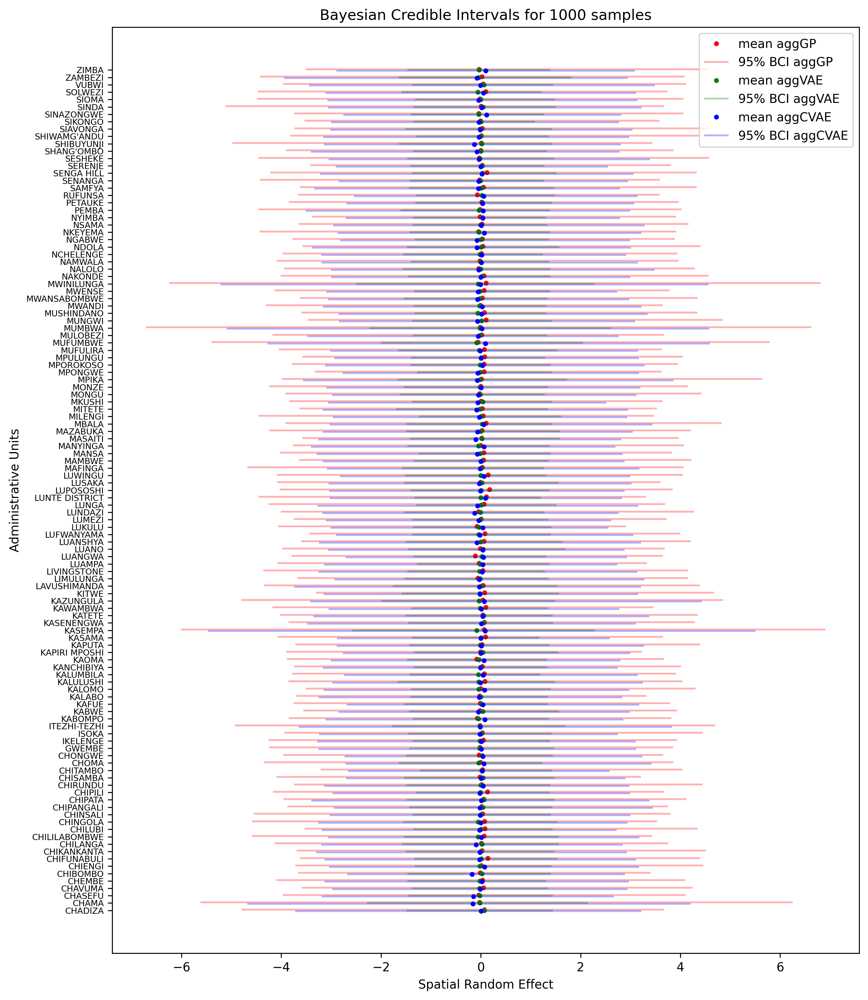

In [63]:
if args["include_aggVAE"]:
    mean_aggvae_draws = jnp.mean(aggvae_draws, axis=0)
    hpdi_aggvae_draws = hpdi(aggvae_draws, 0.95)

    x = np.arange(0, s.shape[0], 1)

    # Sort values for plotting by x axis
    idx = jnp.argsort(x)
    x_axis = s['area']

    mean_aggvae = mean_aggvae_draws[idx]
    hpdi_aggvae = hpdi_aggvae_draws[:, idx]

    # Calculate reasonable figure height based on the number of administrative units
    fig_height = max(len(x_axis) * 0.1, 8)  # Adjust 0.1 as needed to fit the labels comfortably

    # Plot with flipped axes
    plt.figure(figsize=(10, fig_height))  # Increase the height of the figure

    # Introduce an offset for hlines to avoid overlapping by adjusting the index
    offset = 0.1  # Adjust the offset as necessary
    indices = np.arange(len(x_axis))

    plt.plot(mean_gp, indices + offset, ".", label="mean aggGP", color="red")
    plt.hlines(indices + offset, xmin=hpdi_gp[0], xmax=hpdi_gp[1], colors="red", alpha=0.3, label="95% BCI aggGP")

    plt.plot(mean_aggvae, indices, ".", label="mean aggVAE", color="green")
    plt.hlines(indices, xmin=hpdi_aggvae[0], xmax=hpdi_aggvae[1], colors="green", alpha=0.3, label="95% BCI aggVAE")

    plt.plot(mean_cvae, indices - offset, ".", label="mean aggCVAE", color="blue")
    plt.hlines(indices - offset, xmin=hpdi_cvae[0][0], xmax=hpdi_cvae[1][0], colors="blue", alpha=0.3, label="95% BCI aggCVAE")

    # Map the y-ticks back to the original x_axis values (administrative units)
    plt.yticks(indices, x_axis, fontsize=7)  # Customize fontsize and spacing

    plt.legend()
    plt.xlabel('Spatial Random Effect')
    plt.ylabel('Administrative Units')
    plt.title(f'Bayesian Credible Intervals for {args["num_samples_posterior"]} samples')

    # Save plot
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['savefig.dpi'] = 300
    plt.tight_layout()
    plt.savefig('figures/ZMB2018_comparison'+model_specs+'/ZMB2018_comparison'+model_specs+'_BCI_intervals_priors_before_training.pdf')
    plt.show()

    


## Prevalence model - VAE

In [64]:
def prev_model_vae_aggr(args, y=None):

    n_obs = args['n_obs']
    x = args["x"]
    
    # hyperparameters
    ls = numpyro.sample("kernel_length", args['hyperprior_ls'])
    var = numpyro.sample("kernel_var", args['hyperprior_var'])

#     ls = 0.35
#     var = 0.008
    
    # random effect
    decoder_params = args["decoder_params"]
    z_dim_cond, hidden_dim = decoder_params['Dense_0']['kernel'].shape
    z_dim = z_dim_cond - 2   # z_dim_cond includes both lengthscale and variance
    z = numpyro.sample("z", dist.Normal(jnp.zeros(z_dim), jnp.ones(z_dim)))
    z = z.reshape(1, z.shape[0])
    prior_cvae_sample =  build_prior_cvae(num_s, z_dim=args['z_dim'], hidden_dim=args['hidden_dim'])
    decoder_nn = prior_cvae_sample.apply({"params": {'decoder': decoder_params}}, z, var, ls, method='decode')
    vae_aggr = numpyro.deterministic("vae_aggr", decoder_nn)
    
    s = numpyro.sample("sigma", dist.HalfNormal(50))
    vae = numpyro.deterministic('vae', s * vae_aggr)

    # fixed effects
    b0 = numpyro.sample('b0', dist.Normal(0, 1))
    lp = b0 + vae
    theta = numpyro.deterministic("theta", jax.nn.sigmoid(lp))

    numpyro.sample("obs", dist.BinomialLogits(total_count = n_obs, logits=lp), obs=y)

In [65]:
model_specs

'_admin2_mcmcsamp1000_h512_z256_epochs250_lsInverseGamma(3, 3)_varHalfNormal(0.05)'

In [66]:
f"MCMCs/ZMB2018_aggCVAE"+ model_specs + "mcmc"

'MCMCs/ZMB2018_aggCVAE_admin2_mcmcsamp1000_h512_z256_epochs250_lsInverseGamma(3, 3)_varHalfNormal(0.05)mcmc'

In [67]:
# load MCMC
# with open(f"MCMCs/ZMB2018_aggCVAE_admin2_mcmc_n80_h60_z40_epochs100_lsGamma(3, 10)_varGamma(9, 100)", 'rb') as file:
#    mcmc_vae = dill.load(file)
import dill
with open(f"MCMCs/ZMB2018_aggCVAE"+ model_specs + "mcmc", 'rb') as file:
    mcmc_cvae = dill.load(file)


In [68]:
prev_samples_aggcvae = mcmc_cvae.get_samples()
mcmc_cvae.print_summary(exclude_deterministic=False)


                     mean       std    median      5.0%     95.0%     n_eff     r_hat
             b0     -2.08      0.34     -2.10     -2.66     -1.57    667.25      1.01
  kernel_length      0.50      0.14      0.48      0.29      0.73   3729.29      1.00
     kernel_var      0.04      0.03      0.03      0.00      0.08   3498.33      1.00
          sigma      0.55      0.14      0.53      0.34      0.77    578.41      1.01
     theta[0,0]      0.07      0.01      0.07      0.05      0.09   4730.20      1.00
     theta[0,1]      0.05      0.01      0.05      0.03      0.07   4136.09      1.00
     theta[0,2]      0.04      0.01      0.04      0.03      0.06   4666.70      1.00
     theta[0,3]      0.07      0.02      0.07      0.04      0.10   4241.98      1.00
     theta[0,4]      0.06      0.02      0.06      0.04      0.09   4179.70      1.00
     theta[0,5]      0.06      0.01      0.06      0.04      0.07   4660.86      1.00
     theta[0,6]      0.07      0.01      0.07      0.

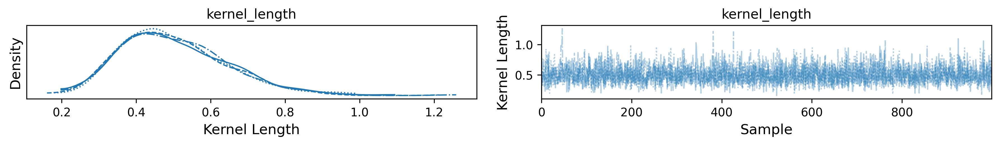

In [69]:
import arviz as az
az_data = az.from_numpyro(mcmc_cvae)
# az.plot_trace(az_data, var_names=('kernel_length'), filter_vars="like")

# Generate the trace plot for 'kernel_length' and retrieve the axes
axes = az.plot_trace(az_data, var_names=("kernel_length"))

# Set the overall title for the figure
# plt.suptitle("Posterior Distribution and Trace of Kernel Lengthscale", fontsize=16)

# Label the x-axis and y-axis for the trace plot (left subplot)
axes[0, 1].set_xlabel("Sample", fontsize=12)
axes[0, 1].set_ylabel("Kernel Length", fontsize=12)

# Label the x-axis and y-axis for the posterior distribution plot (right subplot)
axes[0, 0].set_xlabel("Kernel Length", fontsize=12)
axes[0, 0].set_ylabel("Density", fontsize=12)

# Add y-axis values (ticks) to the posterior distribution plot
axes[0, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))

# # Adjust layout for better spacing
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+ model_specs + '_ls_posterior_trace.pdf')

plt.show()

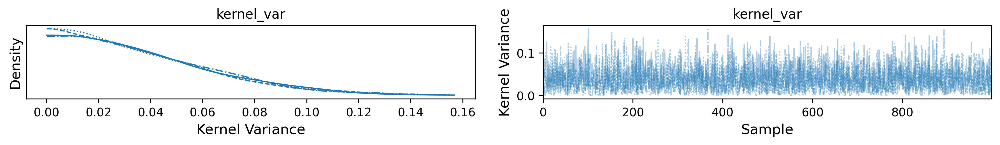

In [70]:
az_data = az.from_numpyro(mcmc_cvae)
# az.plot_trace(az_data, var_names=('kernel_length'), filter_vars="like")

# Generate the trace plot for 'kernel_length' and retrieve the axes
axes = az.plot_trace(az_data, var_names=("kernel_var"))

# Set the overall title for the figure
# plt.suptitle("Posterior Distribution and Trace of Kernel Variance", fontsize=16)

# Label the x-axis and y-axis for the trace plot (left subplot)
axes[0, 1].set_xlabel("Sample", fontsize=12)
axes[0, 1].set_ylabel("Kernel Variance", fontsize=12)

# Label the x-axis and y-axis for the posterior distribution plot (right subplot)
axes[0, 0].set_xlabel("Kernel Variance", fontsize=12)
axes[0, 0].set_ylabel("Density", fontsize=12)

# Add y-axis values (ticks) to the posterior distribution plot
axes[0, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))

# # Adjust layout for better spacing
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+ model_specs + '_var_posterior_trace.pdf')

plt.show()

In [71]:
# posterior predictive - 1
prev_posterior_predictive_cvae = Predictive(prev_model_vae_aggr, prev_samples_aggcvae)(random.PRNGKey(1), args)

theta_samps_cvae_aggr = prev_posterior_predictive_cvae['theta']
theta_mean_cvae_aggr = theta_samps_cvae_aggr.mean(axis=0)
# transpose
theta_mean_cvae_aggr = theta_mean_cvae_aggr.transpose()
bci_cvae_aggr_025 = np.quantile(theta_samps_cvae_aggr, 0.025, axis=0)
bci_cvae_aggr_975 = np.quantile(theta_samps_cvae_aggr, 0.975, axis=0)
hpdi_cvae_aggr = hpdi(theta_samps_cvae_aggr, 0.95)

s['theta_cvae_aggr'] = theta_mean_cvae_aggr

theta_observed = s['estimate']
theta_estimated_cvae_aggr = s['theta_cvae_aggr']

_max = np.max([theta_observed, theta_estimated_cvae_aggr])
_min = np.min([theta_observed, theta_estimated_cvae_aggr])

In [72]:
prev_posterior_predictive_cvae['theta'].shape

(4000, 1, 115)

# aggGP Prevalence Model

In [73]:
def prev_model_gp_aggr(args, y=None):

    n_obs = args['n_obs']
    x = args["x"]
    gp_kernel=args["gp_kernel"]
    jitter = args["jitter"]
    M_new = args["M_new"]

    # random effect - aggregated GP
    length = numpyro.sample("kernel_length", args['hyperprior_ls'])
    var = numpyro.sample("kernel_var", args['hyperprior_var'])
    k = gp_kernel(x, x, var, length, jitter)
    f = numpyro.sample("f", dist.MultivariateNormal(loc=jnp.zeros(x.shape[0]), covariance_matrix=k))

    # aggregate f into gp_aggr according to indexing of (point in polygon)
    gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f))
    # gp_aggr = numpyro.deterministic('gp_aggr', jnp.concatenate([gp_aggr_old, gp_aggr_new]))
    gp_aggr = numpyro.deterministic('gp_aggr', gp_aggr_new)

    # fixed effects
    b0 = numpyro.sample('b0', dist.Normal(0, 1))

    # linear predictor
    lp = b0 + gp_aggr
    theta = numpyro.deterministic("theta", jax.nn.sigmoid(lp))

    numpyro.sample("obs", dist.BinomialLogits(total_count = n_obs, logits=lp), obs=y)

In [74]:
# Load
aggGP_mcmc_filename = f"MCMCs/ZMB2018_aggGP_admin{admin_level}_mcmcsamp3000_lsInverseGamma(3, 3)_varHalfNormal(0.05)_numchains1_mcmc"
with open(aggGP_mcmc_filename, 'rb') as file:
   mcmc_gp_aggr = dill.load(file)

prev_samples_aggr = mcmc_gp_aggr.get_samples()
mcmc_gp_aggr.print_summary(exclude_deterministic=False)


                      mean       std    median      5.0%     95.0%     n_eff     r_hat
              b0     -2.77      0.11     -2.77     -2.96     -2.59    531.83      1.00
            f[0]     -0.00      0.09     -0.00     -0.16      0.15   4807.91      1.00
            f[1]     -0.00      0.09     -0.00     -0.15      0.15   3988.09      1.00
            f[2]      0.00      0.09      0.00     -0.15      0.15   4145.57      1.00
            f[3]      0.00      0.09      0.00     -0.15      0.15   3531.04      1.00
            f[4]     -0.00      0.09      0.00     -0.16      0.14   3356.54      1.00
            f[5]     -0.00      0.09     -0.00     -0.16      0.15   3598.82      1.00
            f[6]     -0.00      0.09     -0.00     -0.15      0.16   4149.87      1.00
            f[7]     -0.00      0.10     -0.00     -0.18      0.14   4256.94      1.00
            f[8]      0.00      0.09      0.00     -0.15      0.16   4474.94      1.00
            f[9]      0.00      0.09      

In [75]:
# posterior predictive
prev_posterior_predictive = Predictive(prev_model_gp_aggr, prev_samples_aggr)(random.PRNGKey(1), args)

theta_samps_gp = prev_posterior_predictive['theta']
theta_mean_gp = theta_samps_gp.mean(axis=0)
hpdi_gp = hpdi(theta_samps_gp, 0.95)

s['theta_gp'] = theta_mean_gp
theta_estimated_gp = s['theta_gp']

In [76]:
theta_mean_gp.shape

(115,)

In [77]:
if args["include_aggVAE"]:
    def prev_model_aggvae(args, y=None):
        n_obs = args['n_obs']
        x = args["x"]

        # random effect
        decoder_params = args["decoder_params_aggvae"]
        z_dim, hidden_dim = decoder_params[0][0].shape
        z = numpyro.sample("z", dist.Normal(jnp.zeros(z_dim), jnp.ones(z_dim)))
        decoder_nn = vae_decoder( hidden_dim, N)
        vae_aggr = numpyro.deterministic("vae_aggr", decoder_nn[1](decoder_params, z))
        s = numpyro.sample("sigma", dist.HalfNormal(50))
        vae = numpyro.deterministic('vae', s * vae_aggr)

        # fixed effects
        b0 = numpyro.sample('b0', dist.Normal(0, 1))
        lp = b0 + vae
        theta = numpyro.deterministic("theta", jax.nn.sigmoid(lp))

        numpyro.sample("obs", dist.BinomialLogits(total_count = n_obs, logits=lp), obs=y)

    with open(f"MCMCs/ZMB2018_aggVAE"+ model_specs + "mcmc", 'rb') as file:
        mcmc_aggvae = dill.load(file)
    
    prev_samples_aggvae = mcmc_aggvae.get_samples()
    mcmc_aggvae.print_summary(exclude_deterministic=False)


                   mean       std    median      5.0%     95.0%     n_eff     r_hat
           b0     -2.47      0.22     -2.47     -2.82     -2.10   3022.19      1.00
        sigma      0.94      0.20      0.92      0.65      1.24   1124.10      1.00
     theta[0]      0.08      0.01      0.08      0.07      0.09   4800.27      1.00
     theta[1]      0.03      0.01      0.03      0.02      0.04   5955.86      1.00
     theta[2]      0.04      0.01      0.04      0.03      0.06   6286.87      1.00
     theta[3]      0.05      0.01      0.05      0.03      0.07   5495.81      1.00
     theta[4]      0.06      0.01      0.06      0.05      0.08   4464.01      1.00
     theta[5]      0.08      0.01      0.08      0.07      0.09   4710.23      1.00
     theta[6]      0.07      0.01      0.07      0.06      0.09   4749.02      1.00
     theta[7]      0.04      0.01      0.04      0.03      0.05   5745.84      1.00
     theta[8]      0.14      0.01      0.14      0.12      0.16   4588.07  

In [78]:
if args["include_aggVAE"]:
    
    # posterior predictive
    prev_posterior_predictive_vae = Predictive(prev_model_aggvae, prev_samples_aggvae)(random.PRNGKey(1), args)
    
    theta_samps_aggvae = prev_posterior_predictive_vae['theta']
    theta_mean_aggvae = theta_samps_aggvae.mean(axis=0)
    hpdi_aggvae = hpdi(theta_samps_aggvae, 0.95)

    s['theta_aggvae'] = theta_mean_aggvae

    theta_observed = s['estimate']
    theta_estimated_aggvae = s['theta_aggvae']

In [79]:
hpdi_aggvae.shape

(2, 115)

# Prevalence maps

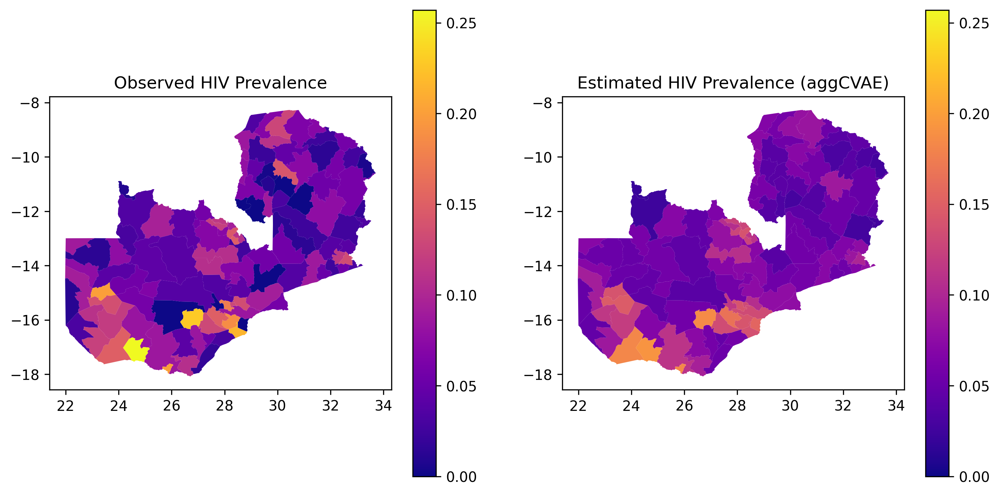

In [80]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

# s[n_old:(n_old + n_new)].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
# s[n_old:(n_old + n_new)].plot(column="theta_vae_aggr", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)

s.plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s.plot(column="theta_cvae_aggr", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)

ax[0].set_title('Observed HIV Prevalence')
ax[1].set_title('Estimated HIV Prevalence (aggCVAE)')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+ model_specs + '_prev_results.pdf')

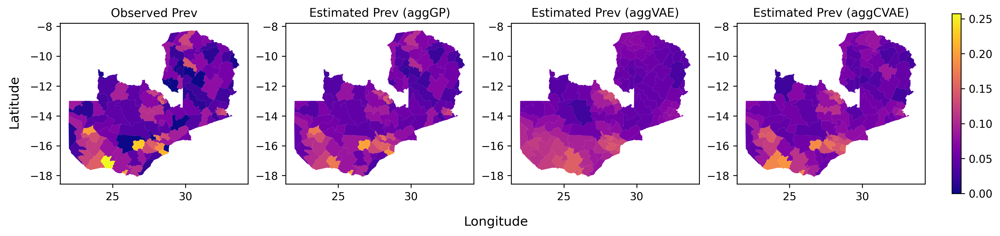

In [81]:
if args["include_aggVAE"]:
    # Create the subplots with added horizontal space between them
    fig, ax = plt.subplots(1, 4, figsize=(15, 4), gridspec_kw={'wspace': 0.2})

    # Define a common colormap and normalization across all plots
    cmap = 'plasma'
    norm = plt.Normalize(vmin=_min, vmax=_max)

    # Plot each subplot without the individual legend
    s.plot(column="estimate", ax=ax[0], cmap=cmap, norm=norm)
    s.plot(column="theta_gp", ax=ax[1], cmap=cmap, norm=norm)
    s.plot(column="theta_aggvae", ax=ax[2], cmap=cmap, norm=norm)
    s.plot(column="theta_cvae_aggr", ax=ax[3], cmap=cmap, norm=norm)

    # Set titles for each subplot
    ax[0].set_title('Observed Prev', fontsize=11)
    ax[1].set_title('Estimated Prev (aggGP)', fontsize=11)
    ax[2].set_title('Estimated Prev (aggVAE)', fontsize=11)
    ax[3].set_title('Estimated Prev (aggCVAE)', fontsize=11)

    # Add a common vertical colorbar
    cbar = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cbar.set_array([])
    fig.colorbar(cbar, ax=ax, orientation='vertical', fraction=0.01, pad=0.03)

    # Add common x-axis and y-axis labels
    fig.text(0.5, 0.1, 'Longitude', ha='center', fontsize=12)
    fig.text(0.08, 0.5, 'Latitude', va='center', rotation='vertical', fontsize=12)

    # Save the figure
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['savefig.dpi'] = 300
    plt.savefig(f'figures/ZMB2018_comparison' + model_specs + '/ZMB2018_comparison' + model_specs + '_prev_results.pdf')

    plt.show()


# BCI Intervals

In [82]:
# # BCI intervals 

# x = np.arange(0, s.shape[0], 1)

# # Sort values for plotting by x axis
# idx = jnp.argsort(x)
# x_axis = s['area']


# # Calculate reasonable figure height based on the number of administrative units
# fig_height = max(len(x_axis) * 0.1, 8)  # Adjust 0.4 as needed to fit the labels comfortably


# # Plot with flipped axes
# plt.figure(figsize=(10, fig_height))  # Increase the height of the figure
# plt.plot(s["estimate"], x_axis, ".", label="Observed")
# plt.plot(theta_mean_cvae_aggr, x_axis, ".", label="Estimated mean") 
# plt.hlines(x_axis, xmin=hpdi_cvae_aggr[0], xmax=hpdi_cvae_aggr[1], colors="blue", alpha=0.3, label="95% BCI aggCVAE")  # Flipped axes           # Flipped axes
# plt.legend()
# plt.xlabel('Prevalence')
# plt.ylabel('Administrative Units')
# plt.title(f'Bayesian Credible Intervals for estimated mean prevalence')

# # Adjust y-axis ticks and label spacing
# plt.yticks(np.arange(len(x_axis)), x_axis, fontsize=7)  # Customize fontsize and spacing

# # Save plot
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['savefig.dpi'] = 300
# plt.tight_layout()
# plt.savefig('figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+model_specs+'_BCI_intervals_estimated_prev.pdf')
# plt.show()

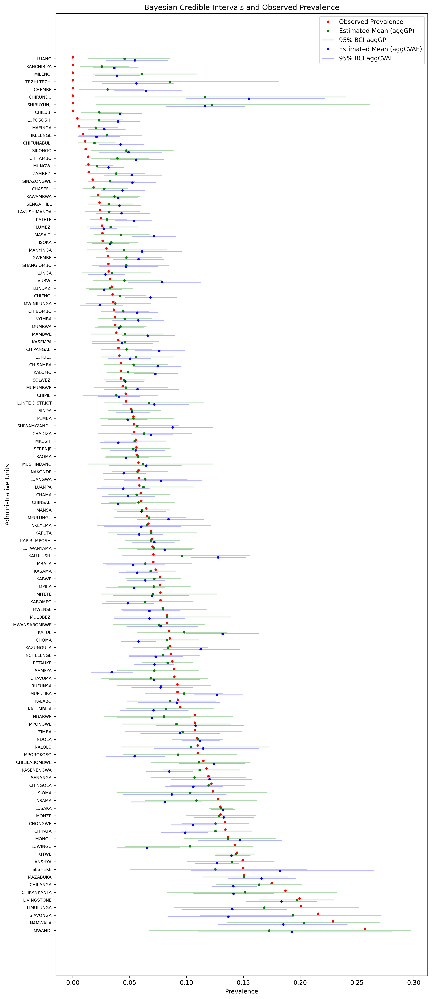

In [91]:
import numpy as np
import matplotlib.pyplot as plt
import jax.numpy as jnp


# Sort based on observed prevalence (assumed to be in `s['prevalence']`)
sorted_indices = (np.argsort(s['estimate'])[::-1]).to_numpy()  # Sort in descending order
x_axis_sorted = s['area'][sorted_indices]

# Sort mean and BCI values
mean_cvae_sorted = theta_mean_cvae_aggr[sorted_indices, 0]
mean_gp_sorted = theta_mean_gp[sorted_indices]
hpdi_cvae_sorted = hpdi_cvae_aggr[:, :, sorted_indices]
hpdi_gp_sorted = hpdi_gp[:, sorted_indices]

# Sort observed prevalence
observed_prevalence_sorted = s['estimate'][sorted_indices]

# Plot with flipped axes and clear separation of elements
fig_height = max(len(x_axis_sorted) * 0.2, 8)
plt.figure(figsize=(10, fig_height))

 # Introduce an offset for hlines to avoid overlapping by adjusting the index
offset = 0.2  # Adjust the offset as necessary
indices_x_axis = np.arange(len(x_axis_sorted))
    
# Plot observed prevalence (as points)
plt.plot(observed_prevalence_sorted, indices_x_axis + offset, ".", label="Observed Prevalence", color="red")

# Plot estimated mean (aggGP) and BCI
plt.plot(mean_gp_sorted, indices_x_axis, ".", label="Estimated Mean (aggGP)", color="green")
plt.hlines(indices_x_axis, xmin=hpdi_gp_sorted[0], xmax=hpdi_gp_sorted[1], colors="green", alpha=0.3, label="95% BCI aggGP")

# Plot estimated mean (aggCVAE) and BCI
plt.plot(mean_cvae_sorted, indices_x_axis - offset, ".", label="Estimated Mean (aggCVAE)", color="blue")
plt.hlines(indices_x_axis - offset, xmin=hpdi_cvae_sorted[0][0], xmax=hpdi_cvae_sorted[1][0], colors="blue", alpha=0.3, label="95% BCI aggCVAE")

# Map the y-ticks back to the original x_axis values (administrative units)
plt.yticks(indices_x_axis, x_axis_sorted, fontsize=7)  # Customize fontsize and spacing


# Customize the plot
plt.legend()
plt.xlabel('Prevalence')
plt.ylabel('Administrative Units')
plt.title(f'Bayesian Credible Intervals and Observed Prevalence')

# Adjust y-axis ticks and label spacing
plt.yticks(np.arange(len(x_axis_sorted)), x_axis_sorted, fontsize=7)

# Save plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.tight_layout()
plt.savefig('figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+model_specs+'_BCI_intervals_priors_after_training.pdf')
plt.show()


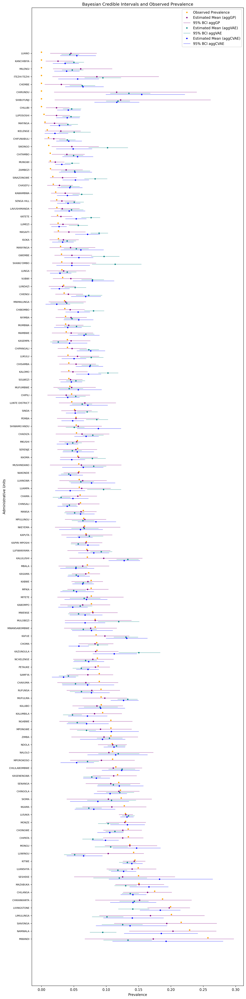

In [99]:
if args["include_aggVAE"]:

    # Sort based on observed prevalence (assumed to be in `s['prevalence']`)
    sorted_indices = (np.argsort(s['estimate'])[::-1]).to_numpy()  # Sort in descending order
    x_axis_sorted = s['area'][sorted_indices]

    # Sort mean and BCI values
    mean_cvae_sorted = theta_mean_cvae_aggr[sorted_indices, 0]
    mean_aggvae_sorted = theta_mean_aggvae[sorted_indices]
    mean_gp_sorted = theta_mean_gp[sorted_indices]
    hpdi_cvae_sorted = hpdi_cvae_aggr[:, :, sorted_indices]
    hpdi_gp_sorted = hpdi_gp[:, sorted_indices]
    hpdi_aggvae_sorted = hpdi_aggvae[:, sorted_indices]

    # Sort observed prevalence
    observed_prevalence_sorted = s['estimate'][sorted_indices]

    # Plot with flipped axes and clear separation of elements
    fig_height = max(len(x_axis_sorted) * 0.35, 8)
    plt.figure(figsize=(10, fig_height))

    # Introduce an offset for hlines to avoid overlapping by adjusting the index
    offset = 0.15  # Adjust the offset as necessary
    indices_x_axis = np.arange(len(x_axis_sorted))

    # Plot observed prevalence (as points)
    plt.plot(observed_prevalence_sorted, indices_x_axis + offset, ".", label="Observed Prevalence", color="orange")

    # Plot estimated mean (aggGP) and BCI
    plt.plot(mean_gp_sorted, indices_x_axis, ".", label="Estimated Mean (aggGP)", color="purple")
    plt.hlines(indices_x_axis, xmin=hpdi_gp_sorted[0], xmax=hpdi_gp_sorted[1], colors="purple", alpha=0.4, label="95% BCI aggGP")

    # Plot estimated mean (aggVAE) and BCI
    plt.plot(mean_aggvae_sorted, indices_x_axis - offset, ".", label="Estimated Mean (aggVAE)", color="teal")
    plt.hlines(indices_x_axis - offset, xmin=hpdi_aggvae_sorted[0], xmax=hpdi_aggvae_sorted[1], colors="teal", alpha=0.4, label="95% BCI aggVAE")

    # Plot estimated mean (aggCVAE) and BCI
    plt.plot(mean_cvae_sorted, indices_x_axis - 2* offset, ".", label="Estimated Mean (aggCVAE)", color="blue")
    plt.hlines(indices_x_axis - 2* offset, xmin=hpdi_cvae_sorted[0][0], xmax=hpdi_cvae_sorted[1][0], colors="blue", alpha=0.4, label="95% BCI aggCVAE")

    # Map the y-ticks back to the original x_axis values (administrative units)
    plt.yticks(indices_x_axis, x_axis_sorted, fontsize=7)  # Customize fontsize and spacing

    # Customize the plot
    plt.legend()
    plt.xlabel('Prevalence')
    plt.ylabel('Administrative Units')
    plt.title(f'Bayesian Credible Intervals and Observed Prevalence')

    # Adjust y-axis ticks and label spacing
    plt.yticks(np.arange(len(x_axis_sorted)), x_axis_sorted, fontsize=7)
    
    # Adjust layout to minimize white space at the bottom
    plt.subplots_adjust(bottom=0.05, top=0.95, left=0.1, right=0.85)

    # Save plot
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['savefig.dpi'] = 300
    plt.tight_layout()
    plt.savefig('figures/ZMB2018_comparison'+model_specs+'/ZMB2018_comparison'+model_specs+'_BCI_intervals_priors_after_training.pdf')
    plt.show()


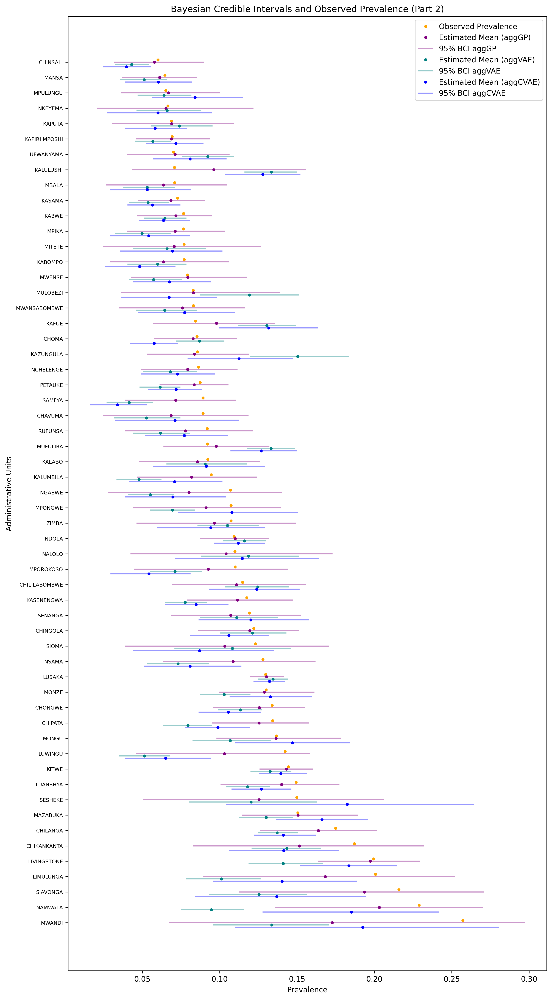

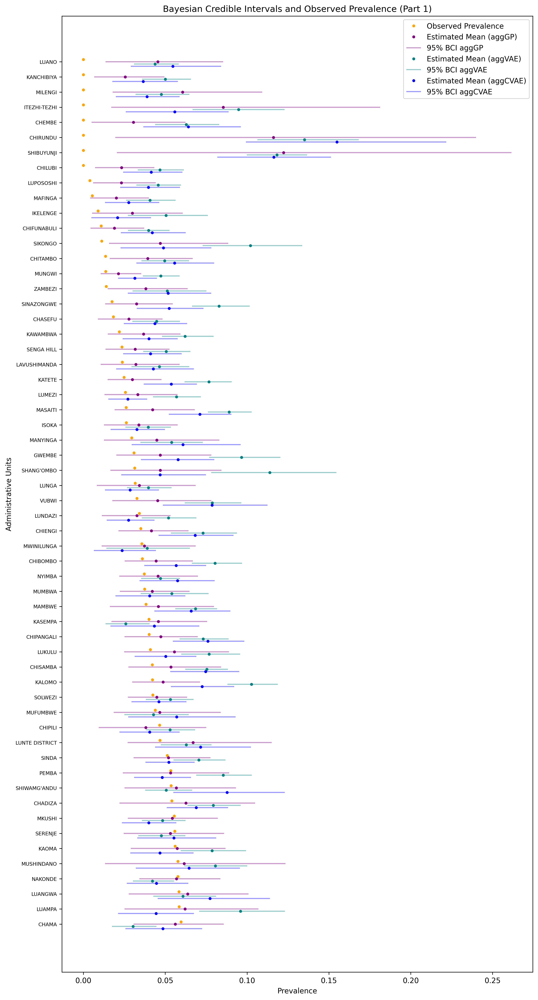

In [105]:
if args["include_aggVAE"]:
    # Sort based on observed prevalence (assumed to be in `s['prevalence']`)
    sorted_indices = (np.argsort(s['estimate'])[::-1]).to_numpy()  # Sort in descending order
    x_axis_sorted = s['area'][sorted_indices]

    # Sort mean and BCI values
    mean_cvae_sorted = theta_mean_cvae_aggr[sorted_indices, 0]
    mean_aggvae_sorted = theta_mean_aggvae[sorted_indices]
    mean_gp_sorted = theta_mean_gp[sorted_indices]
    hpdi_cvae_sorted = hpdi_cvae_aggr[:, :, sorted_indices]
    hpdi_gp_sorted = hpdi_gp[:, sorted_indices]
    hpdi_aggvae_sorted = hpdi_aggvae[:, sorted_indices]

    # Sort observed prevalence
    observed_prevalence_sorted = s['estimate'][sorted_indices]

    # Split data into two halves
    split_index = len(x_axis_sorted) // 2

    # First half
    fig_height = max(split_index * 0.35, 8)
    plt.figure(figsize=(12, fig_height))

    # Introduce an offset for hlines to avoid overlapping by adjusting the index
    offset = 0.15  # Adjust the offset as necessary
    indices_x_axis_1 = np.arange(split_index)

    # Plot observed prevalence (as points) for the first half
    plt.plot(observed_prevalence_sorted[:split_index], indices_x_axis_1 + offset, ".", label="Observed Prevalence", color="orange")

    # Plot estimated mean (aggGP) and BCI for the first half
    plt.plot(mean_gp_sorted[:split_index], indices_x_axis_1, ".", label="Estimated Mean (aggGP)", color="purple")
    plt.hlines(indices_x_axis_1, xmin=hpdi_gp_sorted[0][:split_index], xmax=hpdi_gp_sorted[1][:split_index], colors="purple", alpha=0.4, label="95% BCI aggGP")

    # Plot estimated mean (aggVAE) and BCI for the first half
    plt.plot(mean_aggvae_sorted[:split_index], indices_x_axis_1 - offset, ".", label="Estimated Mean (aggVAE)", color="teal")
    plt.hlines(indices_x_axis_1 - offset, xmin=hpdi_aggvae_sorted[0][:split_index], xmax=hpdi_aggvae_sorted[1][:split_index], colors="teal", alpha=0.4, label="95% BCI aggVAE")

    # Plot estimated mean (aggCVAE) and BCI for the first half
    plt.plot(mean_cvae_sorted[:split_index], indices_x_axis_1 - 2 * offset, ".", label="Estimated Mean (aggCVAE)", color="blue")
    plt.hlines(indices_x_axis_1 - 2 * offset, xmin=hpdi_cvae_sorted[0][0][:split_index], xmax=hpdi_cvae_sorted[1][0][:split_index], colors="blue", alpha=0.4, label="95% BCI aggCVAE")

    # Map the y-ticks back to the original x_axis values (administrative units) for the first half
    plt.yticks(indices_x_axis_1, x_axis_sorted[:split_index], fontsize=7)  # Customize fontsize and spacing

    # Customize the plot for the first half
    plt.legend()
    plt.xlabel('Prevalence')
    plt.ylabel('Administrative Units')
    plt.title(f'Bayesian Credible Intervals and Observed Prevalence (Part 2)')

    # Adjust layout to minimize white space at the bottom
    plt.subplots_adjust(bottom=0.05, top=0.95, left=0.1, right=0.85)

    # Save first half plot
    plt.savefig('figures/ZMB2018_comparison'+model_specs+'/ZMB2018_comparison'+model_specs+'_BCI_intervals_priors_after_training_part2.pdf')
    plt.show()

    # Second half
    fig_height = max((len(x_axis_sorted) - split_index) * 0.35, 8)
    plt.figure(figsize=(12, fig_height))

    # Introduce an offset for hlines to avoid overlapping by adjusting the index
    indices_x_axis_2 = np.arange(len(x_axis_sorted) - split_index)

    # Plot observed prevalence (as points) for the second half
    plt.plot(observed_prevalence_sorted[split_index:], indices_x_axis_2 + offset, ".", label="Observed Prevalence", color="orange")

    # Plot estimated mean (aggGP) and BCI for the second half
    plt.plot(mean_gp_sorted[split_index:], indices_x_axis_2, ".", label="Estimated Mean (aggGP)", color="purple")
    plt.hlines(indices_x_axis_2, xmin=hpdi_gp_sorted[0][split_index:], xmax=hpdi_gp_sorted[1][split_index:], colors="purple", alpha=0.4, label="95% BCI aggGP")

    # Plot estimated mean (aggVAE) and BCI for the second half
    plt.plot(mean_aggvae_sorted[split_index:], indices_x_axis_2 - offset, ".", label="Estimated Mean (aggVAE)", color="teal")
    plt.hlines(indices_x_axis_2 - offset, xmin=hpdi_aggvae_sorted[0][split_index:], xmax=hpdi_aggvae_sorted[1][split_index:], colors="teal", alpha=0.4, label="95% BCI aggVAE")

    # Plot estimated mean (aggCVAE) and BCI for the second half
    plt.plot(mean_cvae_sorted[split_index:], indices_x_axis_2 - 2 * offset, ".", label="Estimated Mean (aggCVAE)", color="blue")
    plt.hlines(indices_x_axis_2 - 2 * offset, xmin=hpdi_cvae_sorted[0][0][split_index:], xmax=hpdi_cvae_sorted[1][0][split_index:], colors="blue", alpha=0.4, label="95% BCI aggCVAE")

    # Map the y-ticks back to the original x_axis values (administrative units) for the second half
    plt.yticks(indices_x_axis_2, x_axis_sorted[split_index:], fontsize=7)  # Customize fontsize and spacing

    # Customize the plot for the second half
    plt.legend()
    plt.xlabel('Prevalence')
    plt.ylabel('Administrative Units')
    plt.title(f'Bayesian Credible Intervals and Observed Prevalence (Part 1)')

    # Adjust layout to minimize white space at the bottom
    plt.subplots_adjust(bottom=0.05, top=0.95, left=0.1, right=0.85)

    # Save second half plot
    plt.savefig('figures/ZMB2018_comparison'+model_specs+'/ZMB2018_comparison'+model_specs+'_BCI_intervals_priors_after_training_part1.pdf')
    plt.show()


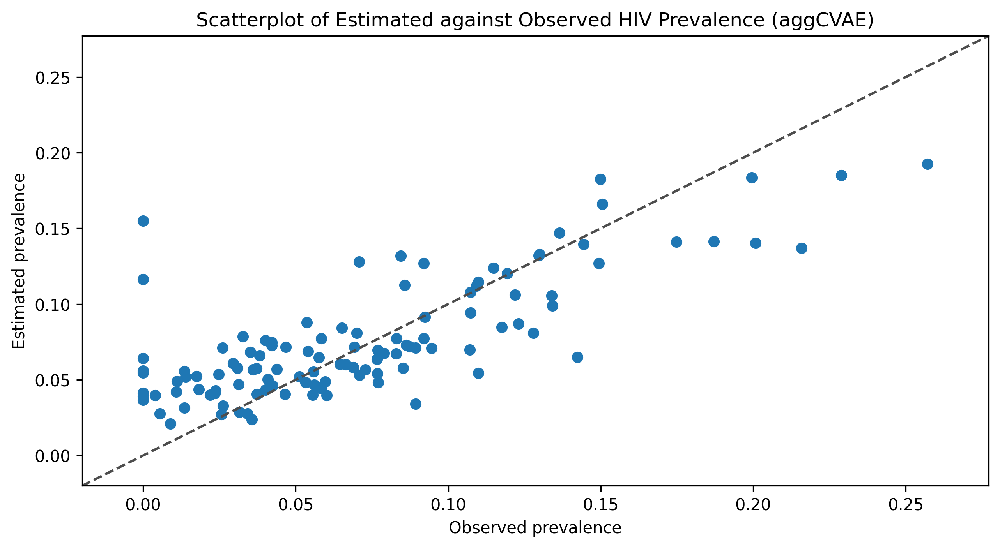

In [85]:
fig, ax = plt.subplots(1, 1, figsize=(10,5))

ax.scatter(s.estimate, s.theta_cvae_aggr)
ax.set_ylim(_min-0.02, _max+0.02)
ax.set_xlim(_min-0.02, _max+0.02)
ax.axline((1, 1), slope=1, ls="--", c=".3")
ax.set_xlabel("Observed prevalence")
ax.set_ylabel("Estimated prevalence")
ax.set_title("Scatterplot of Estimated against Observed HIV Prevalence (aggCVAE)")


plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggCVAE'+model_specs+'/ZMB2018_aggCVAE'+ model_specs + '_prev_results_scatterplot.pdf')

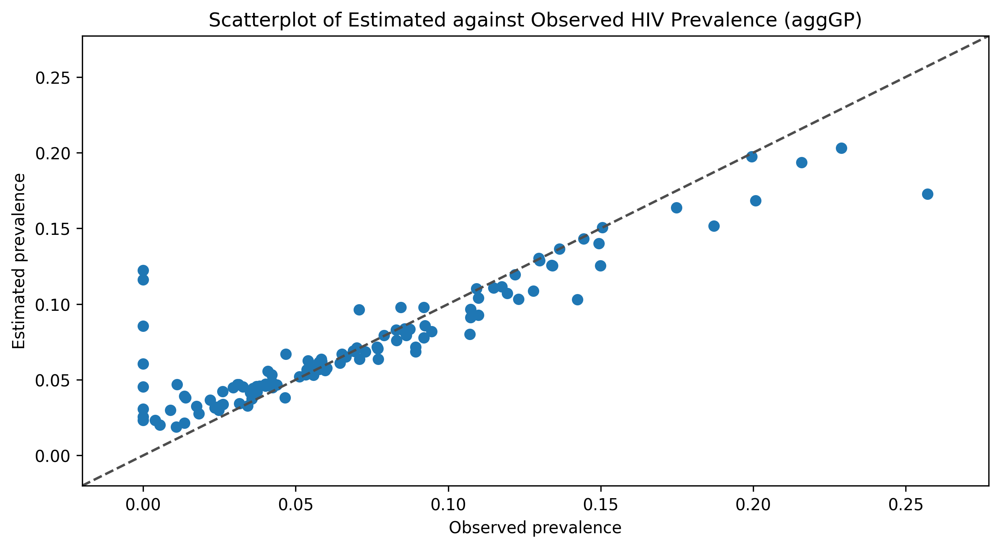

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(10,5))

ax.scatter(s.estimate, s.theta_gp)
ax.set_ylim(_min-0.02, _max+0.02)
ax.set_xlim(_min-0.02, _max+0.02)
ax.axline((1, 1), slope=1, ls="--", c=".3")
ax.set_xlabel("Observed prevalence")
ax.set_ylabel("Estimated prevalence")
ax.set_title("Scatterplot of Estimated against Observed HIV Prevalence (aggGP)")


plt.savefig(f'figures/ZMB2018_aggGP_admin{admin_level}_mcmcsamp3000_lsInverseGamma(3, 3)_varHalfNormal(0.05)_numchains1/ZMB2018_aggGP_admin{admin_level}_mcmcsamp3000_lsInverseGamma(3, 3)_varHalfNormal(0.05)_numchains1_prev_results_scatterplot.pdf')

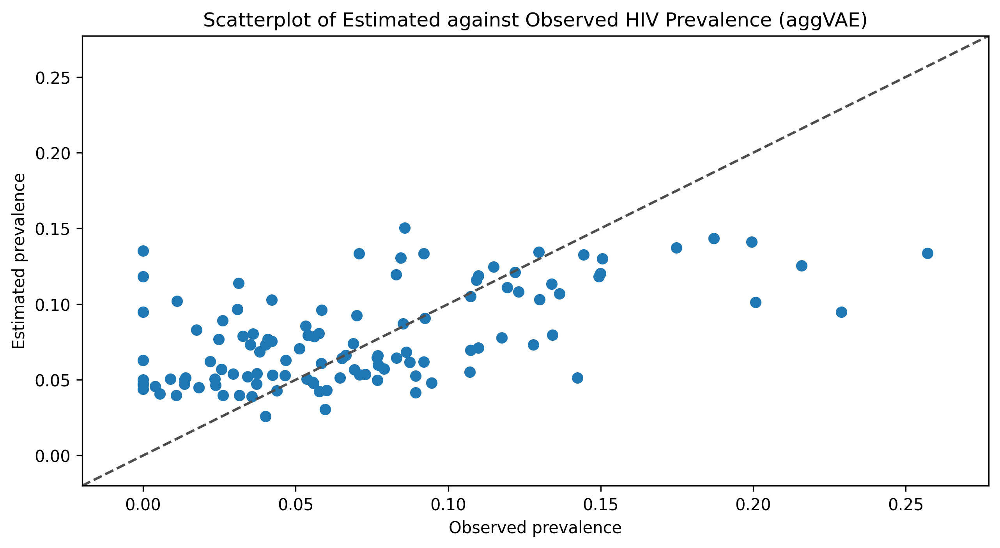

In [87]:
fig, ax = plt.subplots(1, 1, figsize=(10,5))

ax.scatter(s.estimate, s.theta_aggvae)
ax.set_ylim(_min-0.02, _max+0.02)
ax.set_xlim(_min-0.02, _max+0.02)
ax.axline((1, 1), slope=1, ls="--", c=".3")
ax.set_xlabel("Observed prevalence")
ax.set_ylabel("Estimated prevalence")
ax.set_title("Scatterplot of Estimated against Observed HIV Prevalence (aggVAE)")


plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+ model_specs + '_prev_results_scatterplot.pdf')